In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import random
import os
import sys

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import (
    OrdinalEncoder, 
    OneHotEncoder, 
    StandardScaler, 
    MinMaxScaler, 
    RobustScaler
)
import torch
from sklearn.metrics import (
    r2_score, 
    mean_squared_error, 
    mean_absolute_error, 
    mean_absolute_percentage_error, 
)

import warnings
warnings.filterwarnings('ignore')

import seaborn as sns
import collections

pd.set_option('display.max_columns', 2000)
import os
import sys

cwd = os.getcwd()
path = cwd 
#print(path)

In [2]:
seed = 500
np.random.seed(seed)
torch.manual_seed(seed)

import time
import re

In [3]:
df = pd.read_csv(path + "/df_AkBlCmDnEp_Basic_ENG_XRD.csv", index_col = 0)
df

,material_id,formula,full_formula,pretty_formula,energy,energy_per_atom,formation_energy_per_atom,band_gap,structure,cif,A_k,B_l,C_m,D_n,E_p,A_AtomicMass,B_AtomicMass,C_AtomicMass,D_AtomicMass,E_AtomicMass,A_AtomicNumber,B_AtomicNumber,C_AtomicNumber,D_AtomicNumber,E_AtomicNumber,A_AtomicRadius,B_AtomicRadius,C_AtomicRadius,D_AtomicRadius,E_AtomicRadius,A_BoilingPoint,B_BoilingPoint,C_BoilingPoint,D_BoilingPoint,E_BoilingPoint,A_Density,B_Density,C_Density,D_Density,E_Density,A_Electronegativity,B_Electronegativity,C_Electronegativity,D_Electronegativity,E_Electronegativity,A_Electrons,B_Electrons,C_Electrons,D_Electrons,E_Electrons,A_FirstIonization,B_FirstIonization,C_FirstIonization,D_FirstIonization,E_FirstIonization,A_Group,B_Group,C_Group,D_Group,E_Group,A_MassNumber,B_MassNumber,C_MassNumber,D_MassNumber,E_MassNumber,A_MeltingPoint,B_MeltingPoint,C_MeltingPoint,D_MeltingPoint,E_MeltingPoint,A_Metalloid,B_Metalloid,C_Metalloid,D_Metalloid,E_Metalloid,A_Neutrons,B_Neutrons,C_Neutrons,D_Neutrons,E_Neutrons,A_Period,B_Period,C_Period,D_Period,E_Period,A_Phase,B_Phase,C_Phase,D_Phase,E_Phase,A_Protons,B_Protons,C_Protons,D_Protons,E_Protons,A_Shells,B_Shells,C_Shells,D_Shells,E_Shells,A_SpecificHeat,B_SpecificHeat,C_SpecificHeat,D_SpecificHeat,E_SpecificHeat,A_Symbol,B_Symbol,C_Symbol,D_Symbol,E_Symbol,A_Type,B_Type,C_Type,D_Type,E_Type,A_Valence,B_Valence,C_Valence,D_Valence,E_Valence,Weighted_AtomicMass,Weighted_AtomicNumber,Weighted_AtomicRadius,Weighted_BoilingPoint,Weighted_Density,Weighted_Electronegativity,Weighted_FirstIonization,Weighted_MassNumber,Weighted_MeltingPoint,Weighted_SpecificHeat,AddA_kB_lC_mD_nE_p,SubA_kB_lC_mD_nE_p_square,DivA_kB_l,DivA_kC_m,DivA_kD_n,DivA_kE_p,DivB_lC_m,DivB_lD_n,DivB_lE_p,DivC_mD_n,DivC_mE_p,ASubWAM_square,BSubWAM_square,CSubWAM_square,DSubWAM_square,ESubWAM_square,ASubWAN_square,BSubWAN_square,CSubWAN_square,DSubWAN_square,ESubWAN_square,ASubWAR_square,BSubWAR_square,CSubWAR_square,DSubWAR_square,ESubWAR_square,ASubWBP_square,BSubWBP_square,CSubWBP_square,DSubWBP_square,ESubWBP_square,ASubWD_square,BSubWD_square,CSubWD_square,DSubWD_square,ESubWD_square,ASubWE_square,BSubWE_square,CSubWE_square,DSubWE_square,ESubWE_square,ASubWFI_square,BSubWFI_square,CSubWFI_square,DSubWFI_square,ESubWFI_square,ASubWMN_square,BSubWMN_square,CSubWMN_square,DSubWMN_square,ESubWMN_square,ASubWMP_square,BSubWMP_square,CSubWMP_square,ESubWMP_square,DSubWMP_square,ASubWSH_square,BSubWSH_square,CSubWSH_square,DSubWSH_square,ESubWSH_square,Encoded_1,Encoded_2,Encoded_3,Encoded_4,Encoded_5,Encoded_6,Encoded_7,Encoded_8,Encoded_9,Encoded_10,Encoded_11,Encoded_12,Encoded_13,Encoded_14,Encoded_15,Encoded_16,Encoded_17,Encoded_18,Encoded_19,Encoded_20,Encoded_21,Encoded_22,Encoded_23,Encoded_24,Encoded_25,Encoded_26,Encoded_27,Encoded_28,Encoded_29,Encoded_30
0,mp-559882,"{'Hg': 1.0, 'C': 1.0, 'S': 1.0, 'N': 1.0, 'Cl'...",Hg4C4S4N4Cl4,HgCSNCl,-94.858193,-4.742910,-0.300967,2.7469,Full Formula (Hg4 C4 S4 N4 Cl4)\nReduced Formu...,# generated using pymatgen\ndata_HgCSNCl\n_sym...,4,4,4,4,4,200.590,12.011,32.065,14.007,35.453,80,6,16,7,17,1.8,0.91,1.10,0.75,0.97,630.0,4300.0,717.80,77.36,239.11,13.500,2.27,2.07000,0.00125,0.00321,2.00,2.55,2.58,3.04,3.16,80,6,16,7,17,10.4375,11.2603,10.3600,14.5341,12.9676,12,14,16,15,17,201,12,32,14,35,234.43,3948.15,388.510,63.29,172.31,False,False,False,False,False,121,6,16,7,18,6,2,3,2,3,liq,solid,solid,gas,gas,80,6,16,7,17,6,2,3,2,3,0.140,0.709,0.710,1.040,0.479,Hg,C,S,N,Cl,Transition Metal,Nonmetal,Nonmetal,Nonmetal,Halogen,0,4,6,5,7,58.825200,25.200000,1.106000,1192.854000,3.568892,2.666000,11.911900,58.800000,961.338000,0.615600,20,144,1.0,1.000000,1.00,1.00,1.000000,1.00,1.0,1.00,1.00,20097.258519,2191.569322,716.108304,2008.671051,546.259733,3003.040000,368.640000,84.640000,331.240000,67.240000,0.481636,0.038416,0.000036,0.126736,0.018496,3.168046e+05,9.654356e+06,2.256763e+05,1.244327e+06,9.096276e+05,98.626906,1.687120,2.246677,12.728069,12.714088,0.443556,0.013456,0.0

In [5]:
df_basic = df.copy()

In [6]:
df_basic.value_counts(df_basic.A_Type)

A_Type
Alkali Metal            506
Metalloid               293
Alkaline Earth Metal    196
Transition Metal        151
Nonmetal                 55
Metal                    29
Lanthanide               25
dtype: int64

In [8]:
df_basic.value_counts(df_basic.B_Type)

B_Type
Transition Metal        744
Nonmetal                225
Metal                    83
Alkaline Earth Metal     60
Metalloid                54
Alkali Metal             46
Lanthanide               40
Halogen                   3
dtype: int64

In [9]:
df_basic = df_basic[df_basic["B_Type"]!= "Lanthanide"]
df_basic = df_basic[df_basic["B_Type"]!= "Alkaline Earth Metal"]
df_basic = df_basic[df_basic["B_Type"]!= "Halogen"]
df_basic = df_basic[df_basic["B_Type"]!= "Alkali Metal"]

df_basic.reset_index(inplace = True, drop = True)
df_basic

,material_id,formula,full_formula,pretty_formula,energy,energy_per_atom,formation_energy_per_atom,band_gap,structure,cif,A_k,B_l,C_m,D_n,E_p,A_AtomicMass,B_AtomicMass,C_AtomicMass,D_AtomicMass,E_AtomicMass,A_AtomicNumber,B_AtomicNumber,C_AtomicNumber,D_AtomicNumber,E_AtomicNumber,A_AtomicRadius,B_AtomicRadius,C_AtomicRadius,D_AtomicRadius,E_AtomicRadius,A_BoilingPoint,B_BoilingPoint,C_BoilingPoint,D_BoilingPoint,E_BoilingPoint,A_Density,B_Density,C_Density,D_Density,E_Density,A_Electronegativity,B_Electronegativity,C_Electronegativity,D_Electronegativity,E_Electronegativity,A_Electrons,B_Electrons,C_Electrons,D_Electrons,E_Electrons,A_FirstIonization,B_FirstIonization,C_FirstIonization,D_FirstIonization,E_FirstIonization,A_Group,B_Group,C_Group,D_Group,E_Group,A_MassNumber,B_MassNumber,C_MassNumber,D_MassNumber,E_MassNumber,A_MeltingPoint,B_MeltingPoint,C_MeltingPoint,D_MeltingPoint,E_MeltingPoint,A_Metalloid,B_Metalloid,C_Metalloid,D_Metalloid,E_Metalloid,A_Neutrons,B_Neutrons,C_Neutrons,D_Neutrons,E_Neutrons,A_Period,B_Period,C_Period,D_Period,E_Period,A_Phase,B_Phase,C_Phase,D_Phase,E_Phase,A_Protons,B_Protons,C_Protons,D_Protons,E_Protons,A_Shells,B_Shells,C_Shells,D_Shells,E_Shells,A_SpecificHeat,B_SpecificHeat,C_SpecificHeat,D_SpecificHeat,E_SpecificHeat,A_Symbol,B_Symbol,C_Symbol,D_Symbol,E_Symbol,A_Type,B_Type,C_Type,D_Type,E_Type,A_Valence,B_Valence,C_Valence,D_Valence,E_Valence,Weighted_AtomicMass,Weighted_AtomicNumber,Weighted_AtomicRadius,Weighted_BoilingPoint,Weighted_Density,Weighted_Electronegativity,Weighted_FirstIonization,Weighted_MassNumber,Weighted_MeltingPoint,Weighted_SpecificHeat,AddA_kB_lC_mD_nE_p,SubA_kB_lC_mD_nE_p_square,DivA_kB_l,DivA_kC_m,DivA_kD_n,DivA_kE_p,DivB_lC_m,DivB_lD_n,DivB_lE_p,DivC_mD_n,DivC_mE_p,ASubWAM_square,BSubWAM_square,CSubWAM_square,DSubWAM_square,ESubWAM_square,ASubWAN_square,BSubWAN_square,CSubWAN_square,DSubWAN_square,ESubWAN_square,ASubWAR_square,BSubWAR_square,CSubWAR_square,DSubWAR_square,ESubWAR_square,ASubWBP_square,BSubWBP_square,CSubWBP_square,DSubWBP_square,ESubWBP_square,ASubWD_square,BSubWD_square,CSubWD_square,DSubWD_square,ESubWD_square,ASubWE_square,BSubWE_square,CSubWE_square,DSubWE_square,ESubWE_square,ASubWFI_square,BSubWFI_square,CSubWFI_square,DSubWFI_square,ESubWFI_square,ASubWMN_square,BSubWMN_square,CSubWMN_square,DSubWMN_square,ESubWMN_square,ASubWMP_square,BSubWMP_square,CSubWMP_square,ESubWMP_square,DSubWMP_square,ASubWSH_square,BSubWSH_square,CSubWSH_square,DSubWSH_square,ESubWSH_square,Encoded_1,Encoded_2,Encoded_3,Encoded_4,Encoded_5,Encoded_6,Encoded_7,Encoded_8,Encoded_9,Encoded_10,Encoded_11,Encoded_12,Encoded_13,Encoded_14,Encoded_15,Encoded_16,Encoded_17,Encoded_18,Encoded_19,Encoded_20,Encoded_21,Encoded_22,Encoded_23,Encoded_24,Encoded_25,Encoded_26,Encoded_27,Encoded_28,Encoded_29,Encoded_30
0,mp-559882,"{'Hg': 1.0, 'C': 1.0, 'S': 1.0, 'N': 1.0, 'Cl'...",Hg4C4S4N4Cl4,HgCSNCl,-94.858193,-4.742910,-0.300967,2.7469,Full Formula (Hg4 C4 S4 N4 Cl4)\nReduced Formu...,# generated using pymatgen\ndata_HgCSNCl\n_sym...,4,4,4,4,4,200.590,12.011,32.065,14.007,35.453,80,6,16,7,17,1.8,0.91,1.10,0.75,0.97,630.0,4300.0,717.80,77.36,239.11,13.500,2.27,2.07000,0.00125,0.00321,2.00,2.55,2.58,3.04,3.16,80,6,16,7,17,10.4375,11.2603,10.3600,14.5341,12.9676,12,14,16,15,17,201,12,32,14,35,234.43,3948.15,388.510,63.29,172.31,False,False,False,False,False,121,6,16,7,18,6,2,3,2,3,liq,solid,solid,gas,gas,80,6,16,7,17,6,2,3,2,3,0.140,0.709,0.710,1.040,0.479,Hg,C,S,N,Cl,Transition Metal,Nonmetal,Nonmetal,Nonmetal,Halogen,0,4,6,5,7,58.825200,25.200000,1.106000,1192.854000,3.568892,2.666000,11.911900,58.800000,961.338000,0.615600,20,144,1.0,1.000000,1.00,1.00,1.000000,1.00,1.0,1.00,1.00,20097.258519,2191.569322,716.108304,2008.671051,546.259733,3003.040000,368.640000,84.640000,331.240000,67.240000,0.481636,0.038416,0.000036,0.126736,0.018496,3.168046e+05,9.654356e+06,2.256763e+05,1.244327e+06,9.096276e+05,98.626906,1.687120,2.246677,12.728069,12.714088,0.443556,0.013456,0.0

In [11]:
df_basic = df_basic[df_basic["C_Type"]!= "Lanthanide"]
df_basic = df_basic[df_basic["C_Type"]!= "Alkaline Earth Metal"]
df_basic = df_basic[df_basic["C_Type"]!= "Alkali Metal"]

df_basic.reset_index(inplace = True, drop = True)
df_basic

,material_id,formula,full_formula,pretty_formula,energy,energy_per_atom,formation_energy_per_atom,band_gap,structure,cif,A_k,B_l,C_m,D_n,E_p,A_AtomicMass,B_AtomicMass,C_AtomicMass,D_AtomicMass,E_AtomicMass,A_AtomicNumber,B_AtomicNumber,C_AtomicNumber,D_AtomicNumber,E_AtomicNumber,A_AtomicRadius,B_AtomicRadius,C_AtomicRadius,D_AtomicRadius,E_AtomicRadius,A_BoilingPoint,B_BoilingPoint,C_BoilingPoint,D_BoilingPoint,E_BoilingPoint,A_Density,B_Density,C_Density,D_Density,E_Density,A_Electronegativity,B_Electronegativity,C_Electronegativity,D_Electronegativity,E_Electronegativity,A_Electrons,B_Electrons,C_Electrons,D_Electrons,E_Electrons,A_FirstIonization,B_FirstIonization,C_FirstIonization,D_FirstIonization,E_FirstIonization,A_Group,B_Group,C_Group,D_Group,E_Group,A_MassNumber,B_MassNumber,C_MassNumber,D_MassNumber,E_MassNumber,A_MeltingPoint,B_MeltingPoint,C_MeltingPoint,D_MeltingPoint,E_MeltingPoint,A_Metalloid,B_Metalloid,C_Metalloid,D_Metalloid,E_Metalloid,A_Neutrons,B_Neutrons,C_Neutrons,D_Neutrons,E_Neutrons,A_Period,B_Period,C_Period,D_Period,E_Period,A_Phase,B_Phase,C_Phase,D_Phase,E_Phase,A_Protons,B_Protons,C_Protons,D_Protons,E_Protons,A_Shells,B_Shells,C_Shells,D_Shells,E_Shells,A_SpecificHeat,B_SpecificHeat,C_SpecificHeat,D_SpecificHeat,E_SpecificHeat,A_Symbol,B_Symbol,C_Symbol,D_Symbol,E_Symbol,A_Type,B_Type,C_Type,D_Type,E_Type,A_Valence,B_Valence,C_Valence,D_Valence,E_Valence,Weighted_AtomicMass,Weighted_AtomicNumber,Weighted_AtomicRadius,Weighted_BoilingPoint,Weighted_Density,Weighted_Electronegativity,Weighted_FirstIonization,Weighted_MassNumber,Weighted_MeltingPoint,Weighted_SpecificHeat,AddA_kB_lC_mD_nE_p,SubA_kB_lC_mD_nE_p_square,DivA_kB_l,DivA_kC_m,DivA_kD_n,DivA_kE_p,DivB_lC_m,DivB_lD_n,DivB_lE_p,DivC_mD_n,DivC_mE_p,ASubWAM_square,BSubWAM_square,CSubWAM_square,DSubWAM_square,ESubWAM_square,ASubWAN_square,BSubWAN_square,CSubWAN_square,DSubWAN_square,ESubWAN_square,ASubWAR_square,BSubWAR_square,CSubWAR_square,DSubWAR_square,ESubWAR_square,ASubWBP_square,BSubWBP_square,CSubWBP_square,DSubWBP_square,ESubWBP_square,ASubWD_square,BSubWD_square,CSubWD_square,DSubWD_square,ESubWD_square,ASubWE_square,BSubWE_square,CSubWE_square,DSubWE_square,ESubWE_square,ASubWFI_square,BSubWFI_square,CSubWFI_square,DSubWFI_square,ESubWFI_square,ASubWMN_square,BSubWMN_square,CSubWMN_square,DSubWMN_square,ESubWMN_square,ASubWMP_square,BSubWMP_square,CSubWMP_square,ESubWMP_square,DSubWMP_square,ASubWSH_square,BSubWSH_square,CSubWSH_square,DSubWSH_square,ESubWSH_square,Encoded_1,Encoded_2,Encoded_3,Encoded_4,Encoded_5,Encoded_6,Encoded_7,Encoded_8,Encoded_9,Encoded_10,Encoded_11,Encoded_12,Encoded_13,Encoded_14,Encoded_15,Encoded_16,Encoded_17,Encoded_18,Encoded_19,Encoded_20,Encoded_21,Encoded_22,Encoded_23,Encoded_24,Encoded_25,Encoded_26,Encoded_27,Encoded_28,Encoded_29,Encoded_30
0,mp-559882,"{'Hg': 1.0, 'C': 1.0, 'S': 1.0, 'N': 1.0, 'Cl'...",Hg4C4S4N4Cl4,HgCSNCl,-94.858193,-4.742910,-0.300967,2.7469,Full Formula (Hg4 C4 S4 N4 Cl4)\nReduced Formu...,# generated using pymatgen\ndata_HgCSNCl\n_sym...,4,4,4,4,4,200.590,12.011,32.065,14.007,35.453,80,6,16,7,17,1.8,0.91,1.10,0.75,0.97,630.0,4300.0,717.80,77.36,239.11,13.500,2.27,2.07000,0.00125,0.00321,2.00,2.55,2.58,3.04,3.16,80,6,16,7,17,10.4375,11.2603,10.3600,14.5341,12.9676,12,14,16,15,17,201,12,32,14,35,234.43,3948.15,388.510,63.29,172.31,False,False,False,False,False,121,6,16,7,18,6,2,3,2,3,liq,solid,solid,gas,gas,80,6,16,7,17,6,2,3,2,3,0.140,0.709,0.710,1.040,0.479,Hg,C,S,N,Cl,Transition Metal,Nonmetal,Nonmetal,Nonmetal,Halogen,0,4,6,5,7,58.825200,25.200000,1.106000,1192.854000,3.568892,2.666000,11.911900,58.800000,961.338000,0.615600,20,144,1.0,1.000000,1.00,1.00,1.000000,1.00,1.0,1.00,1.00,20097.258519,2191.569322,716.108304,2008.671051,546.259733,3003.040000,368.640000,84.640000,331.240000,67.240000,0.481636,0.038416,0.000036,0.126736,0.018496,3.168046e+05,9.654356e+06,2.256763e+05,1.244327e+06,9.096276e+05,98.626906,1.687120,2.246677,12.728069,12.714088,0.443556,0.013456,0.0

In [13]:
df_basic = df_basic[df_basic["D_Type"]!= "Metal"]
df_basic = df_basic[df_basic["D_Type"]!= "Transition Metal"]
df_basic = df_basic[df_basic["C_Type"]!= "Alkali Metal"]

df_basic.reset_index(inplace = True, drop = True)
df_basic

,material_id,formula,full_formula,pretty_formula,energy,energy_per_atom,formation_energy_per_atom,band_gap,structure,cif,A_k,B_l,C_m,D_n,E_p,A_AtomicMass,B_AtomicMass,C_AtomicMass,D_AtomicMass,E_AtomicMass,A_AtomicNumber,B_AtomicNumber,C_AtomicNumber,D_AtomicNumber,E_AtomicNumber,A_AtomicRadius,B_AtomicRadius,C_AtomicRadius,D_AtomicRadius,E_AtomicRadius,A_BoilingPoint,B_BoilingPoint,C_BoilingPoint,D_BoilingPoint,E_BoilingPoint,A_Density,B_Density,C_Density,D_Density,E_Density,A_Electronegativity,B_Electronegativity,C_Electronegativity,D_Electronegativity,E_Electronegativity,A_Electrons,B_Electrons,C_Electrons,D_Electrons,E_Electrons,A_FirstIonization,B_FirstIonization,C_FirstIonization,D_FirstIonization,E_FirstIonization,A_Group,B_Group,C_Group,D_Group,E_Group,A_MassNumber,B_MassNumber,C_MassNumber,D_MassNumber,E_MassNumber,A_MeltingPoint,B_MeltingPoint,C_MeltingPoint,D_MeltingPoint,E_MeltingPoint,A_Metalloid,B_Metalloid,C_Metalloid,D_Metalloid,E_Metalloid,A_Neutrons,B_Neutrons,C_Neutrons,D_Neutrons,E_Neutrons,A_Period,B_Period,C_Period,D_Period,E_Period,A_Phase,B_Phase,C_Phase,D_Phase,E_Phase,A_Protons,B_Protons,C_Protons,D_Protons,E_Protons,A_Shells,B_Shells,C_Shells,D_Shells,E_Shells,A_SpecificHeat,B_SpecificHeat,C_SpecificHeat,D_SpecificHeat,E_SpecificHeat,A_Symbol,B_Symbol,C_Symbol,D_Symbol,E_Symbol,A_Type,B_Type,C_Type,D_Type,E_Type,A_Valence,B_Valence,C_Valence,D_Valence,E_Valence,Weighted_AtomicMass,Weighted_AtomicNumber,Weighted_AtomicRadius,Weighted_BoilingPoint,Weighted_Density,Weighted_Electronegativity,Weighted_FirstIonization,Weighted_MassNumber,Weighted_MeltingPoint,Weighted_SpecificHeat,AddA_kB_lC_mD_nE_p,SubA_kB_lC_mD_nE_p_square,DivA_kB_l,DivA_kC_m,DivA_kD_n,DivA_kE_p,DivB_lC_m,DivB_lD_n,DivB_lE_p,DivC_mD_n,DivC_mE_p,ASubWAM_square,BSubWAM_square,CSubWAM_square,DSubWAM_square,ESubWAM_square,ASubWAN_square,BSubWAN_square,CSubWAN_square,DSubWAN_square,ESubWAN_square,ASubWAR_square,BSubWAR_square,CSubWAR_square,DSubWAR_square,ESubWAR_square,ASubWBP_square,BSubWBP_square,CSubWBP_square,DSubWBP_square,ESubWBP_square,ASubWD_square,BSubWD_square,CSubWD_square,DSubWD_square,ESubWD_square,ASubWE_square,BSubWE_square,CSubWE_square,DSubWE_square,ESubWE_square,ASubWFI_square,BSubWFI_square,CSubWFI_square,DSubWFI_square,ESubWFI_square,ASubWMN_square,BSubWMN_square,CSubWMN_square,DSubWMN_square,ESubWMN_square,ASubWMP_square,BSubWMP_square,CSubWMP_square,ESubWMP_square,DSubWMP_square,ASubWSH_square,BSubWSH_square,CSubWSH_square,DSubWSH_square,ESubWSH_square,Encoded_1,Encoded_2,Encoded_3,Encoded_4,Encoded_5,Encoded_6,Encoded_7,Encoded_8,Encoded_9,Encoded_10,Encoded_11,Encoded_12,Encoded_13,Encoded_14,Encoded_15,Encoded_16,Encoded_17,Encoded_18,Encoded_19,Encoded_20,Encoded_21,Encoded_22,Encoded_23,Encoded_24,Encoded_25,Encoded_26,Encoded_27,Encoded_28,Encoded_29,Encoded_30
0,mp-559882,"{'Hg': 1.0, 'C': 1.0, 'S': 1.0, 'N': 1.0, 'Cl'...",Hg4C4S4N4Cl4,HgCSNCl,-94.858193,-4.742910,-0.300967,2.7469,Full Formula (Hg4 C4 S4 N4 Cl4)\nReduced Formu...,# generated using pymatgen\ndata_HgCSNCl\n_sym...,4,4,4,4,4,200.590,12.011,32.065,14.007,35.453,80,6,16,7,17,1.8,0.91,1.10,0.75,0.97,630.0,4300.0,717.80,77.36,239.11,13.500,2.27,2.07000,0.00125,0.00321,2.00,2.55,2.58,3.04,3.16,80,6,16,7,17,10.4375,11.2603,10.3600,14.5341,12.9676,12,14,16,15,17,201,12,32,14,35,234.43,3948.15,388.510,63.29,172.31,False,False,False,False,False,121,6,16,7,18,6,2,3,2,3,liq,solid,solid,gas,gas,80,6,16,7,17,6,2,3,2,3,0.140,0.709,0.710,1.040,0.479,Hg,C,S,N,Cl,Transition Metal,Nonmetal,Nonmetal,Nonmetal,Halogen,0,4,6,5,7,58.825200,25.200000,1.106000,1192.854000,3.568892,2.666000,11.911900,58.800000,961.338000,0.615600,20,144,1.0,1.000000,1.00,1.00,1.000000,1.00,1.0,1.00,1.00,20097.258519,2191.569322,716.108304,2008.671051,546.259733,3003.040000,368.640000,84.640000,331.240000,67.240000,0.481636,0.038416,0.000036,0.126736,0.018496,3.168046e+05,9.654356e+06,2.256763e+05,1.244327e+06,9.096276e+05,98.626906,1.687120,2.246677,12.728069,12.714088,0.443556,0.013456,0.0

In [14]:
#df_xrd = pd.read_csv(path + "/df_ABCDE_XRD.csv", index_col = 0)
#df_xrd

In [15]:
df_basic.drop(columns = ["material_id","full_formula","formula","pretty_formula","energy","formation_energy_per_atom","band_gap","structure","cif",
                        "A_Symbol","B_Symbol","C_Symbol","D_Symbol","E_Symbol"],inplace = True)
df_basic

,energy_per_atom,A_k,B_l,C_m,D_n,E_p,A_AtomicMass,B_AtomicMass,C_AtomicMass,D_AtomicMass,E_AtomicMass,A_AtomicNumber,B_AtomicNumber,C_AtomicNumber,D_AtomicNumber,E_AtomicNumber,A_AtomicRadius,B_AtomicRadius,C_AtomicRadius,D_AtomicRadius,E_AtomicRadius,A_BoilingPoint,B_BoilingPoint,C_BoilingPoint,D_BoilingPoint,E_BoilingPoint,A_Density,B_Density,C_Density,D_Density,E_Density,A_Electronegativity,B_Electronegativity,C_Electronegativity,D_Electronegativity,E_Electronegativity,A_Electrons,B_Electrons,C_Electrons,D_Electrons,E_Electrons,A_FirstIonization,B_FirstIonization,C_FirstIonization,D_FirstIonization,E_FirstIonization,A_Group,B_Group,C_Group,D_Group,E_Group,A_MassNumber,B_MassNumber,C_MassNumber,D_MassNumber,E_MassNumber,A_MeltingPoint,B_MeltingPoint,C_MeltingPoint,D_MeltingPoint,E_MeltingPoint,A_Metalloid,B_Metalloid,C_Metalloid,D_Metalloid,E_Metalloid,A_Neutrons,B_Neutrons,C_Neutrons,D_Neutrons,E_Neutrons,A_Period,B_Period,C_Period,D_Period,E_Period,A_Phase,B_Phase,C_Phase,D_Phase,E_Phase,A_Protons,B_Protons,C_Protons,D_Protons,E_Protons,A_Shells,B_Shells,C_Shells,D_Shells,E_Shells,A_SpecificHeat,B_SpecificHeat,C_SpecificHeat,D_SpecificHeat,E_SpecificHeat,A_Type,B_Type,C_Type,D_Type,E_Type,A_Valence,B_Valence,C_Valence,D_Valence,E_Valence,Weighted_AtomicMass,Weighted_AtomicNumber,Weighted_AtomicRadius,Weighted_BoilingPoint,Weighted_Density,Weighted_Electronegativity,Weighted_FirstIonization,Weighted_MassNumber,Weighted_MeltingPoint,Weighted_SpecificHeat,AddA_kB_lC_mD_nE_p,SubA_kB_lC_mD_nE_p_square,DivA_kB_l,DivA_kC_m,DivA_kD_n,DivA_kE_p,DivB_lC_m,DivB_lD_n,DivB_lE_p,DivC_mD_n,DivC_mE_p,ASubWAM_square,BSubWAM_square,CSubWAM_square,DSubWAM_square,ESubWAM_square,ASubWAN_square,BSubWAN_square,CSubWAN_square,DSubWAN_square,ESubWAN_square,ASubWAR_square,BSubWAR_square,CSubWAR_square,DSubWAR_square,ESubWAR_square,ASubWBP_square,BSubWBP_square,CSubWBP_square,DSubWBP_square,ESubWBP_square,ASubWD_square,BSubWD_square,CSubWD_square,DSubWD_square,ESubWD_square,ASubWE_square,BSubWE_square,CSubWE_square,DSubWE_square,ESubWE_square,ASubWFI_square,BSubWFI_square,CSubWFI_square,DSubWFI_square,ESubWFI_square,ASubWMN_square,BSubWMN_square,CSubWMN_square,DSubWMN_square,ESubWMN_square,ASubWMP_square,BSubWMP_square,CSubWMP_square,ESubWMP_square,DSubWMP_square,ASubWSH_square,BSubWSH_square,CSubWSH_square,DSubWSH_square,ESubWSH_square,Encoded_1,Encoded_2,Encoded_3,Encoded_4,Encoded_5,Encoded_6,Encoded_7,Encoded_8,Encoded_9,Encoded_10,Encoded_11,Encoded_12,Encoded_13,Encoded_14,Encoded_15,Encoded_16,Encoded_17,Encoded_18,Encoded_19,Encoded_20,Encoded_21,Encoded_22,Encoded_23,Encoded_24,Encoded_25,Encoded_26,Encoded_27,Encoded_28,Encoded_29,Encoded_30
0,-4.742910,4,4,4,4,4,200.590,12.011,32.065,14.007,35.453,80,6,16,7,17,1.8,0.91,1.10,0.75,0.97,630.0,4300.0,717.80,77.36,239.11,13.500,2.27,2.07000,0.00125,0.00321,2.00,2.55,2.58,3.04,3.16,80,6,16,7,17,10.4375,11.2603,10.3600,14.5341,12.9676,12,14,16,15,17,201,12,32,14,35,234.43,3948.15,388.510,63.29,172.31,False,False,False,False,False,121,6,16,7,18,6,2,3,2,3,liq,solid,solid,gas,gas,80,6,16,7,17,6,2,3,2,3,0.140,0.709,0.710,1.040,0.479,Transition Metal,Nonmetal,Nonmetal,Nonmetal,Halogen,0,4,6,5,7,58.825200,25.200000,1.106000,1192.854000,3.568892,2.666000,11.911900,58.800000,961.338000,0.615600,20,144,1.0,1.000000,1.00,1.00,1.000000,1.00,1.0,1.00,1.00,20097.258519,2191.569322,716.108304,2008.671051,546.259733,3003.040000,368.640000,84.640000,331.240000,67.240000,0.481636,0.038416,0.000036,0.126736,0.018496,3.168046e+05,9.654356e+06,2.256763e+05,1.244327e+06,9.096276e+05,98.626906,1.687120,2.246677,12.728069,12.714088,0.443556,0.013456,0.007396,0.139876,0.244036,2.173855,0.424583,2.408394,6.875933,1.114502,20220.840000,2190.240000,718.240000,2007.040000,566.440000,5.283952e+05,8.921046e+06,3.281319e+05,6.225652e+05,8.064902e+05,0.226195,0.008724,0.008911,0.180115,0.018660,0.000000,0.0,5.575090,0.0,0.0,20.903234,20.883892,0.0,0.000000,29.057568,2.097818,20.709497,40.347973,8.362555,23.658430,16.663408,5.8

In [43]:
data = df_basic.copy()
#data = pd.concat([df_basic,df_xrd],axis = 1)
data

,energy_per_atom,A_k,B_l,C_m,D_n,E_p,A_AtomicMass,B_AtomicMass,C_AtomicMass,D_AtomicMass,E_AtomicMass,A_AtomicNumber,B_AtomicNumber,C_AtomicNumber,D_AtomicNumber,E_AtomicNumber,A_AtomicRadius,B_AtomicRadius,C_AtomicRadius,D_AtomicRadius,E_AtomicRadius,A_BoilingPoint,B_BoilingPoint,C_BoilingPoint,D_BoilingPoint,E_BoilingPoint,A_Density,B_Density,C_Density,D_Density,E_Density,A_Electronegativity,B_Electronegativity,C_Electronegativity,D_Electronegativity,E_Electronegativity,A_Electrons,B_Electrons,C_Electrons,D_Electrons,E_Electrons,A_FirstIonization,B_FirstIonization,C_FirstIonization,D_FirstIonization,E_FirstIonization,A_Group,B_Group,C_Group,D_Group,E_Group,A_MassNumber,B_MassNumber,C_MassNumber,D_MassNumber,E_MassNumber,A_MeltingPoint,B_MeltingPoint,C_MeltingPoint,D_MeltingPoint,E_MeltingPoint,A_Metalloid,B_Metalloid,C_Metalloid,D_Metalloid,E_Metalloid,A_Neutrons,B_Neutrons,C_Neutrons,D_Neutrons,E_Neutrons,A_Period,B_Period,C_Period,D_Period,E_Period,A_Phase,B_Phase,C_Phase,D_Phase,E_Phase,A_Protons,B_Protons,C_Protons,D_Protons,E_Protons,A_Shells,B_Shells,C_Shells,D_Shells,E_Shells,A_SpecificHeat,B_SpecificHeat,C_SpecificHeat,D_SpecificHeat,E_SpecificHeat,A_Type,B_Type,C_Type,D_Type,E_Type,A_Valence,B_Valence,C_Valence,D_Valence,E_Valence,Weighted_AtomicMass,Weighted_AtomicNumber,Weighted_AtomicRadius,Weighted_BoilingPoint,Weighted_Density,Weighted_Electronegativity,Weighted_FirstIonization,Weighted_MassNumber,Weighted_MeltingPoint,Weighted_SpecificHeat,AddA_kB_lC_mD_nE_p,SubA_kB_lC_mD_nE_p_square,DivA_kB_l,DivA_kC_m,DivA_kD_n,DivA_kE_p,DivB_lC_m,DivB_lD_n,DivB_lE_p,DivC_mD_n,DivC_mE_p,ASubWAM_square,BSubWAM_square,CSubWAM_square,DSubWAM_square,ESubWAM_square,ASubWAN_square,BSubWAN_square,CSubWAN_square,DSubWAN_square,ESubWAN_square,ASubWAR_square,BSubWAR_square,CSubWAR_square,DSubWAR_square,ESubWAR_square,ASubWBP_square,BSubWBP_square,CSubWBP_square,DSubWBP_square,ESubWBP_square,ASubWD_square,BSubWD_square,CSubWD_square,DSubWD_square,ESubWD_square,ASubWE_square,BSubWE_square,CSubWE_square,DSubWE_square,ESubWE_square,ASubWFI_square,BSubWFI_square,CSubWFI_square,DSubWFI_square,ESubWFI_square,ASubWMN_square,BSubWMN_square,CSubWMN_square,DSubWMN_square,ESubWMN_square,ASubWMP_square,BSubWMP_square,CSubWMP_square,ESubWMP_square,DSubWMP_square,ASubWSH_square,BSubWSH_square,CSubWSH_square,DSubWSH_square,ESubWSH_square,Encoded_1,Encoded_2,Encoded_3,Encoded_4,Encoded_5,Encoded_6,Encoded_7,Encoded_8,Encoded_9,Encoded_10,Encoded_11,Encoded_12,Encoded_13,Encoded_14,Encoded_15,Encoded_16,Encoded_17,Encoded_18,Encoded_19,Encoded_20,Encoded_21,Encoded_22,Encoded_23,Encoded_24,Encoded_25,Encoded_26,Encoded_27,Encoded_28,Encoded_29,Encoded_30
0,-4.742910,4,4,4,4,4,200.590,12.011,32.065,14.007,35.453,80,6,16,7,17,1.8,0.91,1.10,0.75,0.97,630.0,4300.0,717.80,77.36,239.11,13.500,2.27,2.07000,0.00125,0.00321,2.00,2.55,2.58,3.04,3.16,80,6,16,7,17,10.4375,11.2603,10.3600,14.5341,12.9676,12,14,16,15,17,201,12,32,14,35,234.43,3948.15,388.510,63.29,172.31,False,False,False,False,False,121,6,16,7,18,6,2,3,2,3,liq,solid,solid,gas,gas,80,6,16,7,17,6,2,3,2,3,0.140,0.709,0.710,1.040,0.479,Transition Metal,Nonmetal,Nonmetal,Nonmetal,Halogen,0,4,6,5,7,58.825200,25.200000,1.106000,1192.854000,3.568892,2.666000,11.911900,58.800000,961.338000,0.615600,20,144,1.0,1.000000,1.00,1.00,1.000000,1.00,1.0,1.00,1.00,20097.258519,2191.569322,716.108304,2008.671051,546.259733,3003.040000,368.640000,84.640000,331.240000,67.240000,0.481636,0.038416,0.000036,0.126736,0.018496,3.168046e+05,9.654356e+06,2.256763e+05,1.244327e+06,9.096276e+05,98.626906,1.687120,2.246677,12.728069,12.714088,0.443556,0.013456,0.007396,0.139876,0.244036,2.173855,0.424583,2.408394,6.875933,1.114502,20220.840000,2190.240000,718.240000,2007.040000,566.440000,5.283952e+05,8.921046e+06,3.281319e+05,6.225652e+05,8.064902e+05,0.226195,0.008724,0.008911,0.180115,0.018660,0.000000,0.0,5.575090,0.0,0.0,20.903234,20.883892,0.0,0.000000,29.057568,2.097818,20.709497,40.347973,8.362555,23.658430,16.663408,5.8

In [44]:
#data.to_csv("data_ABCD_basic_ENG_XRD.csv")

## Part 1: Exploratory Data Analysis (EDA)

### Part 1.1: Import Files and Load Data

In [45]:
#pip install pydotplus

In [46]:
from math import sqrt
from scipy import stats
from scipy.stats import norm, skew
# Re-import necessary components
from sklearn.preprocessing import PowerTransformer, RobustScaler
from scipy.stats import probplot
from sklearn import preprocessing, tree
from sklearn.preprocessing import  OrdinalEncoder, LabelEncoder, MinMaxScaler,StandardScaler
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, RandomizedSearchCV, KFold
from sklearn.linear_model import LinearRegression, Lasso, LassoCV, LassoLarsCV, Ridge, RidgeCV 
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.utils import shuffle
from sklearn.pipeline import Pipeline
from sklearn.tree import DecisionTreeRegressor

import xgboost
from xgboost import XGBRegressor, plot_importance
from lightgbm import LGBMRegressor

#Special display options
pd.set_option("display.max_columns", None) 
import warnings
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

### การสำรวจข้อมูลพื้นฐาน

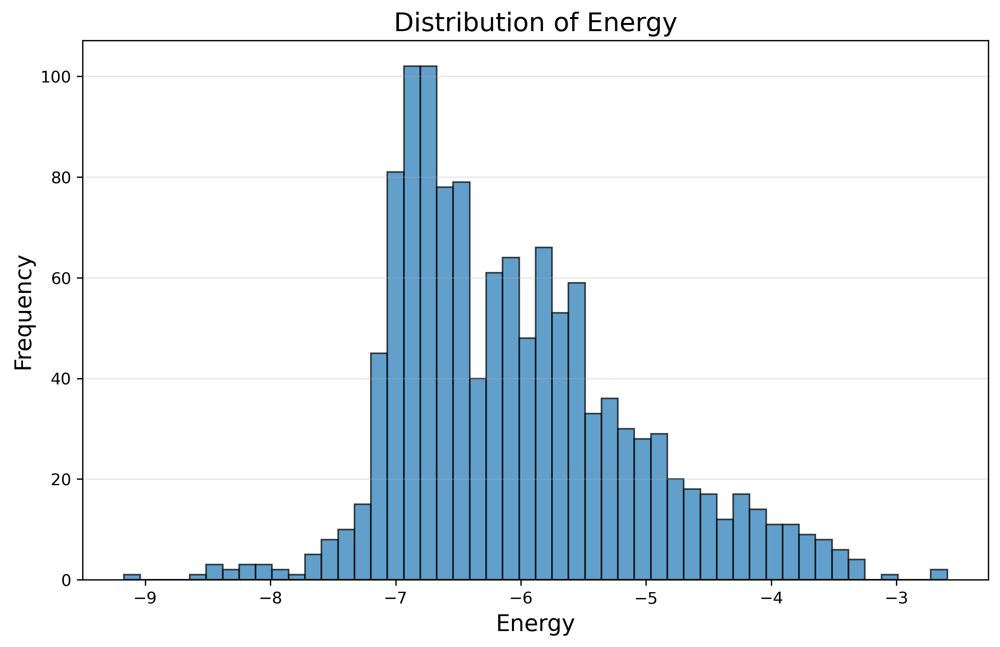

In [47]:
# Plot the distribution of the 'energy' column
plt.figure(figsize=(10, 6),dpi = 300)
data['energy_per_atom'].plot(kind='hist', bins=50, edgecolor='k', alpha=0.7)
#data['formation_energy_per_atom'].plot(kind='hist', bins=50, edgecolor='k', alpha=0.7)
plt.title('Distribution of Energy', fontsize=16)
plt.xlabel('Energy', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(axis='y', alpha=0.3)
plt.show()

In [48]:
# Calculate basic statistics for the 'energy' column
energy_stats = data['energy_per_atom'].describe()
#energy_stats = data['formation_energy_per_atom'].describe()

energy_stats


count    1238.000000
mean       -6.031818
std         0.960290
min        -9.170203
25%        -6.737874
50%        -6.211115
75%        -5.490235
max        -2.594087
Name: energy_per_atom, dtype: float64

ค่าพลังงานส่วนใหญ่จะอยู่ในช่วงประมาณ -198.40 ถึง -72.70 และมีค่าเฉลี่ยอยู่ที่ -157.35โดยมีการกระจายตัวที่กว้างเนื่องจากส่วนเบี่ยงเบนมาตรฐานค่อนข้างสูง คือ 139.03 

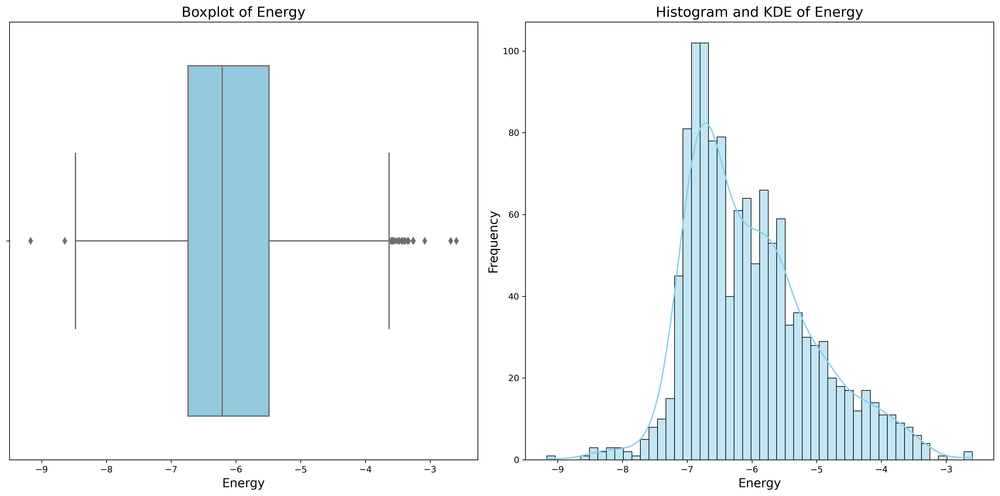

In [49]:
# Visualize the distribution of 'energy' using a boxplot and histogram
plt.figure(figsize=(16, 8), dpi = 300)

# Boxplot
plt.subplot(1, 2, 1)
sns.boxplot(x=data['energy_per_atom'], orient='h', color='skyblue')
#sns.boxplot(x=data['formation_energy_per_atom'], orient='h', color='skyblue')

plt.title('Boxplot of Energy', fontsize=16)
plt.xlabel('Energy', fontsize=14)

# Histogram with KDE
plt.subplot(1, 2, 2)
sns.histplot(data['energy_per_atom'], kde=True, bins=50, color='skyblue')
#sns.histplot(data['formation_energy_per_atom'], kde=True, bins=50, color='skyblue')

plt.title('Histogram and KDE of Energy', fontsize=16)
plt.xlabel('Energy', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

plt.tight_layout()
plt.show()

จากการวิเคราะห์เพิ่มเติมโดยใช้ Boxplot และ Histogram:

Boxplot:

มีค่า outliers ที่ต่ำกว่าค่าต่ำสุดของกลุ่มข้อมูลปกติอยู่ในช่วงค่าพลังงานที่น้อยมาก
ข้อมูลส่วนใหญ่กระจุกตัวอยู่ในช่วงประมาณ -250 ถึง -50

Histogram พร้อมเส้น KDE:

การกระจายตัวของค่าพลังงานเป็นแบบ skewed distribution โดยค่าพลังงานส่วนใหญ่มีค่าติดลบ

เส้น KDE (Kernel Density Estimation) แสดงการกระจายตัวของข้อมูลในลักษณะที่เน้นจุดที่ความถี่สูง

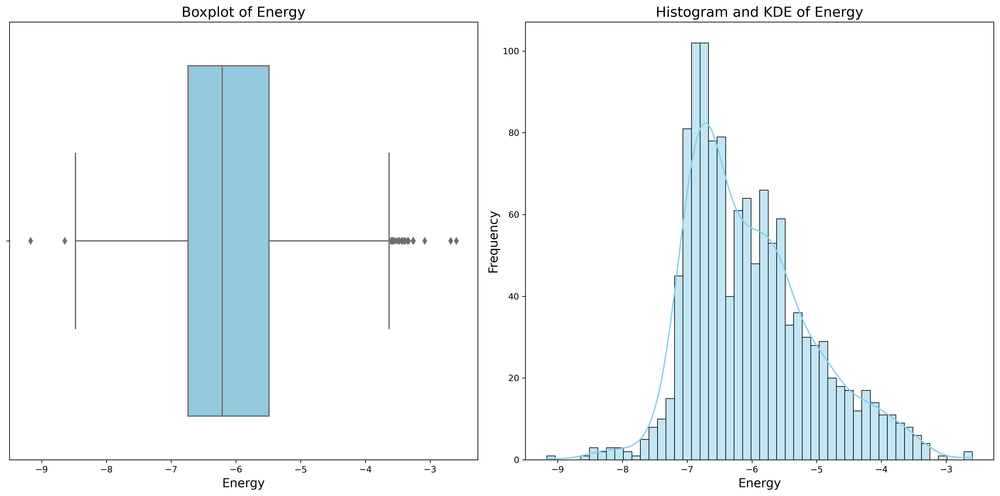

In [50]:
# Visualize the distribution of 'energy' using a boxplot and histogram
plt.figure(figsize=(16, 8), dpi = 300)

# Boxplot
plt.subplot(1, 2, 1)
sns.boxplot(x=data['energy_per_atom'], orient='h', color='skyblue')
#sns.boxplot(x=data['formation_energy_per_atom'], orient='h', color='skyblue')

plt.title('Boxplot of Energy', fontsize=16)
plt.xlabel('Energy', fontsize=14)

# Histogram with KDE
plt.subplot(1, 2, 2)
sns.histplot(data['energy_per_atom'], kde=True, bins=50, color='skyblue')
#sns.histplot(data['formation_energy_per_atom'], kde=True, bins=50, color='skyblue')

plt.title('Histogram and KDE of Energy', fontsize=16)
plt.xlabel('Energy', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'QQ Plot of Original Energy')

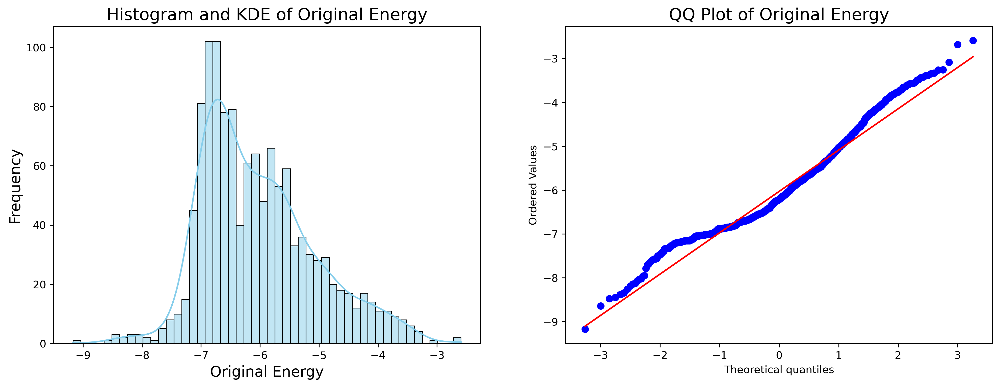

In [51]:
# Step 4: Visualize the distributions and QQ Plots
from scipy.stats import probplot
plt.figure(figsize=(16, 12),dpi = 300)

# Histogram and KDE for Original Energy
plt.subplot(2, 2, 1)
sns.histplot(data[['energy_per_atom']].values.flatten(), kde=True, bins=50, color='skyblue')
#sns.histplot(data[['formation_energy_per_atom']].values.flatten(), kde=True, bins=50, color='skyblue')

plt.title('Histogram and KDE of Original Energy', fontsize=16)
plt.xlabel('Original Energy', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

# QQ Plot for Original Energy
plt.subplot(2, 2, 2)
probplot(data[['energy_per_atom']].values.flatten(), dist="norm", plot=plt)
#probplot(data[['formation_energy_per_atom']].values.flatten(), dist="norm", plot=plt)

plt.title('QQ Plot of Original Energy', fontsize=16)


In [52]:
data

,energy_per_atom,A_k,B_l,C_m,D_n,E_p,A_AtomicMass,B_AtomicMass,C_AtomicMass,D_AtomicMass,E_AtomicMass,A_AtomicNumber,B_AtomicNumber,C_AtomicNumber,D_AtomicNumber,E_AtomicNumber,A_AtomicRadius,B_AtomicRadius,C_AtomicRadius,D_AtomicRadius,E_AtomicRadius,A_BoilingPoint,B_BoilingPoint,C_BoilingPoint,D_BoilingPoint,E_BoilingPoint,A_Density,B_Density,C_Density,D_Density,E_Density,A_Electronegativity,B_Electronegativity,C_Electronegativity,D_Electronegativity,E_Electronegativity,A_Electrons,B_Electrons,C_Electrons,D_Electrons,E_Electrons,A_FirstIonization,B_FirstIonization,C_FirstIonization,D_FirstIonization,E_FirstIonization,A_Group,B_Group,C_Group,D_Group,E_Group,A_MassNumber,B_MassNumber,C_MassNumber,D_MassNumber,E_MassNumber,A_MeltingPoint,B_MeltingPoint,C_MeltingPoint,D_MeltingPoint,E_MeltingPoint,A_Metalloid,B_Metalloid,C_Metalloid,D_Metalloid,E_Metalloid,A_Neutrons,B_Neutrons,C_Neutrons,D_Neutrons,E_Neutrons,A_Period,B_Period,C_Period,D_Period,E_Period,A_Phase,B_Phase,C_Phase,D_Phase,E_Phase,A_Protons,B_Protons,C_Protons,D_Protons,E_Protons,A_Shells,B_Shells,C_Shells,D_Shells,E_Shells,A_SpecificHeat,B_SpecificHeat,C_SpecificHeat,D_SpecificHeat,E_SpecificHeat,A_Type,B_Type,C_Type,D_Type,E_Type,A_Valence,B_Valence,C_Valence,D_Valence,E_Valence,Weighted_AtomicMass,Weighted_AtomicNumber,Weighted_AtomicRadius,Weighted_BoilingPoint,Weighted_Density,Weighted_Electronegativity,Weighted_FirstIonization,Weighted_MassNumber,Weighted_MeltingPoint,Weighted_SpecificHeat,AddA_kB_lC_mD_nE_p,SubA_kB_lC_mD_nE_p_square,DivA_kB_l,DivA_kC_m,DivA_kD_n,DivA_kE_p,DivB_lC_m,DivB_lD_n,DivB_lE_p,DivC_mD_n,DivC_mE_p,ASubWAM_square,BSubWAM_square,CSubWAM_square,DSubWAM_square,ESubWAM_square,ASubWAN_square,BSubWAN_square,CSubWAN_square,DSubWAN_square,ESubWAN_square,ASubWAR_square,BSubWAR_square,CSubWAR_square,DSubWAR_square,ESubWAR_square,ASubWBP_square,BSubWBP_square,CSubWBP_square,DSubWBP_square,ESubWBP_square,ASubWD_square,BSubWD_square,CSubWD_square,DSubWD_square,ESubWD_square,ASubWE_square,BSubWE_square,CSubWE_square,DSubWE_square,ESubWE_square,ASubWFI_square,BSubWFI_square,CSubWFI_square,DSubWFI_square,ESubWFI_square,ASubWMN_square,BSubWMN_square,CSubWMN_square,DSubWMN_square,ESubWMN_square,ASubWMP_square,BSubWMP_square,CSubWMP_square,ESubWMP_square,DSubWMP_square,ASubWSH_square,BSubWSH_square,CSubWSH_square,DSubWSH_square,ESubWSH_square,Encoded_1,Encoded_2,Encoded_3,Encoded_4,Encoded_5,Encoded_6,Encoded_7,Encoded_8,Encoded_9,Encoded_10,Encoded_11,Encoded_12,Encoded_13,Encoded_14,Encoded_15,Encoded_16,Encoded_17,Encoded_18,Encoded_19,Encoded_20,Encoded_21,Encoded_22,Encoded_23,Encoded_24,Encoded_25,Encoded_26,Encoded_27,Encoded_28,Encoded_29,Encoded_30
0,-4.742910,4,4,4,4,4,200.590,12.011,32.065,14.007,35.453,80,6,16,7,17,1.8,0.91,1.10,0.75,0.97,630.0,4300.0,717.80,77.36,239.11,13.500,2.27,2.07000,0.00125,0.00321,2.00,2.55,2.58,3.04,3.16,80,6,16,7,17,10.4375,11.2603,10.3600,14.5341,12.9676,12,14,16,15,17,201,12,32,14,35,234.43,3948.15,388.510,63.29,172.31,False,False,False,False,False,121,6,16,7,18,6,2,3,2,3,liq,solid,solid,gas,gas,80,6,16,7,17,6,2,3,2,3,0.140,0.709,0.710,1.040,0.479,Transition Metal,Nonmetal,Nonmetal,Nonmetal,Halogen,0,4,6,5,7,58.825200,25.200000,1.106000,1192.854000,3.568892,2.666000,11.911900,58.800000,961.338000,0.615600,20,144,1.0,1.000000,1.00,1.00,1.000000,1.00,1.0,1.00,1.00,20097.258519,2191.569322,716.108304,2008.671051,546.259733,3003.040000,368.640000,84.640000,331.240000,67.240000,0.481636,0.038416,0.000036,0.126736,0.018496,3.168046e+05,9.654356e+06,2.256763e+05,1.244327e+06,9.096276e+05,98.626906,1.687120,2.246677,12.728069,12.714088,0.443556,0.013456,0.007396,0.139876,0.244036,2.173855,0.424583,2.408394,6.875933,1.114502,20220.840000,2190.240000,718.240000,2007.040000,566.440000,5.283952e+05,8.921046e+06,3.281319e+05,6.225652e+05,8.064902e+05,0.226195,0.008724,0.008911,0.180115,0.018660,0.000000,0.0,5.575090,0.0,0.0,20.903234,20.883892,0.0,0.000000,29.057568,2.097818,20.709497,40.347973,8.362555,23.658430,16.663408,5.8

In [53]:
print(data.columns)

Index(['energy_per_atom', 'A_k', 'B_l', 'C_m', 'D_n', 'E_p', 'A_AtomicMass',
       'B_AtomicMass', 'C_AtomicMass', 'D_AtomicMass',
       ...
       'Encoded_21', 'Encoded_22', 'Encoded_23', 'Encoded_24', 'Encoded_25',
       'Encoded_26', 'Encoded_27', 'Encoded_28', 'Encoded_29', 'Encoded_30'],
      dtype='object', length=207)


In [54]:
# Outliers

# คำนวณ Q1, Q3 และ IQR ของ Target
Q1 = data['energy_per_atom'].quantile(0.25)  # ควอไทล์ที่ 1
Q3 = data['energy_per_atom'].quantile(0.75)  # ควอไทล์ที่ 3
IQR = Q3 - Q1  # ช่วง IQR

# คำนวณขอบเขตล่างและบน
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# กรองข้อมูลให้อยู่ในช่วงปกติ
filtered_data = data[(data['energy_per_atom'] >= lower_bound) & (data['energy_per_atom'] <= upper_bound)]

# แสดงผล
print(f"จำนวนข้อมูลก่อนกรอง: {len(data)}")
print(f"จำนวนข้อมูลหลังกรอง: {len(filtered_data)}")
print(f"ค่าเป้าหมายต่ำสุดและสูงสุดหลังกรอง: {filtered_data['energy_per_atom'].min()}, {filtered_data['energy_per_atom'].max()}")

filtered_data.reset_index(inplace = True, drop = True)
data = filtered_data.copy()
data  

จำนวนข้อมูลก่อนกรอง: 1238
จำนวนข้อมูลหลังกรอง: 1216
ค่าเป้าหมายต่ำสุดและสูงสุดหลังกรอง: -8.4771455725, -3.6338180775


,energy_per_atom,A_k,B_l,C_m,D_n,E_p,A_AtomicMass,B_AtomicMass,C_AtomicMass,D_AtomicMass,E_AtomicMass,A_AtomicNumber,B_AtomicNumber,C_AtomicNumber,D_AtomicNumber,E_AtomicNumber,A_AtomicRadius,B_AtomicRadius,C_AtomicRadius,D_AtomicRadius,E_AtomicRadius,A_BoilingPoint,B_BoilingPoint,C_BoilingPoint,D_BoilingPoint,E_BoilingPoint,A_Density,B_Density,C_Density,D_Density,E_Density,A_Electronegativity,B_Electronegativity,C_Electronegativity,D_Electronegativity,E_Electronegativity,A_Electrons,B_Electrons,C_Electrons,D_Electrons,E_Electrons,A_FirstIonization,B_FirstIonization,C_FirstIonization,D_FirstIonization,E_FirstIonization,A_Group,B_Group,C_Group,D_Group,E_Group,A_MassNumber,B_MassNumber,C_MassNumber,D_MassNumber,E_MassNumber,A_MeltingPoint,B_MeltingPoint,C_MeltingPoint,D_MeltingPoint,E_MeltingPoint,A_Metalloid,B_Metalloid,C_Metalloid,D_Metalloid,E_Metalloid,A_Neutrons,B_Neutrons,C_Neutrons,D_Neutrons,E_Neutrons,A_Period,B_Period,C_Period,D_Period,E_Period,A_Phase,B_Phase,C_Phase,D_Phase,E_Phase,A_Protons,B_Protons,C_Protons,D_Protons,E_Protons,A_Shells,B_Shells,C_Shells,D_Shells,E_Shells,A_SpecificHeat,B_SpecificHeat,C_SpecificHeat,D_SpecificHeat,E_SpecificHeat,A_Type,B_Type,C_Type,D_Type,E_Type,A_Valence,B_Valence,C_Valence,D_Valence,E_Valence,Weighted_AtomicMass,Weighted_AtomicNumber,Weighted_AtomicRadius,Weighted_BoilingPoint,Weighted_Density,Weighted_Electronegativity,Weighted_FirstIonization,Weighted_MassNumber,Weighted_MeltingPoint,Weighted_SpecificHeat,AddA_kB_lC_mD_nE_p,SubA_kB_lC_mD_nE_p_square,DivA_kB_l,DivA_kC_m,DivA_kD_n,DivA_kE_p,DivB_lC_m,DivB_lD_n,DivB_lE_p,DivC_mD_n,DivC_mE_p,ASubWAM_square,BSubWAM_square,CSubWAM_square,DSubWAM_square,ESubWAM_square,ASubWAN_square,BSubWAN_square,CSubWAN_square,DSubWAN_square,ESubWAN_square,ASubWAR_square,BSubWAR_square,CSubWAR_square,DSubWAR_square,ESubWAR_square,ASubWBP_square,BSubWBP_square,CSubWBP_square,DSubWBP_square,ESubWBP_square,ASubWD_square,BSubWD_square,CSubWD_square,DSubWD_square,ESubWD_square,ASubWE_square,BSubWE_square,CSubWE_square,DSubWE_square,ESubWE_square,ASubWFI_square,BSubWFI_square,CSubWFI_square,DSubWFI_square,ESubWFI_square,ASubWMN_square,BSubWMN_square,CSubWMN_square,DSubWMN_square,ESubWMN_square,ASubWMP_square,BSubWMP_square,CSubWMP_square,ESubWMP_square,DSubWMP_square,ASubWSH_square,BSubWSH_square,CSubWSH_square,DSubWSH_square,ESubWSH_square,Encoded_1,Encoded_2,Encoded_3,Encoded_4,Encoded_5,Encoded_6,Encoded_7,Encoded_8,Encoded_9,Encoded_10,Encoded_11,Encoded_12,Encoded_13,Encoded_14,Encoded_15,Encoded_16,Encoded_17,Encoded_18,Encoded_19,Encoded_20,Encoded_21,Encoded_22,Encoded_23,Encoded_24,Encoded_25,Encoded_26,Encoded_27,Encoded_28,Encoded_29,Encoded_30
0,-4.742910,4,4,4,4,4,200.590,12.011,32.065,14.007,35.453,80,6,16,7,17,1.8,0.91,1.10,0.75,0.97,630.0,4300.0,717.80,77.36,239.11,13.500,2.27,2.07000,0.00125,0.00321,2.00,2.55,2.58,3.04,3.16,80,6,16,7,17,10.4375,11.2603,10.3600,14.5341,12.9676,12,14,16,15,17,201,12,32,14,35,234.43,3948.15,388.510,63.29,172.31,False,False,False,False,False,121,6,16,7,18,6,2,3,2,3,liq,solid,solid,gas,gas,80,6,16,7,17,6,2,3,2,3,0.140,0.709,0.710,1.040,0.479,Transition Metal,Nonmetal,Nonmetal,Nonmetal,Halogen,0,4,6,5,7,58.825200,25.200000,1.106000,1192.854000,3.568892,2.666000,11.911900,58.800000,961.338000,0.615600,20,144,1.0,1.000000,1.00,1.00,1.000000,1.00,1.0,1.00,1.00,20097.258519,2191.569322,716.108304,2008.671051,546.259733,3003.040000,368.640000,84.640000,331.240000,67.240000,0.481636,0.038416,0.000036,0.126736,0.018496,3.168046e+05,9.654356e+06,2.256763e+05,1.244327e+06,9.096276e+05,98.626906,1.687120,2.246677,12.728069,12.714088,0.443556,0.013456,0.007396,0.139876,0.244036,2.173855,0.424583,2.408394,6.875933,1.114502,20220.840000,2190.240000,718.240000,2007.040000,566.440000,5.283952e+05,8.921046e+06,3.281319e+05,6.225652e+05,8.064902e+05,0.226195,0.008724,0.008911,0.180115,0.018660,0.000000,0.0,5.575090,0.0,0.0,20.903234,20.883892,0.0,0.000000,29.057568,2.097818,20.709497,40.347973,8.362555,23.658430,16.663408,5.8

Text(0.5, 1.0, 'QQ Plot of Original Energy')

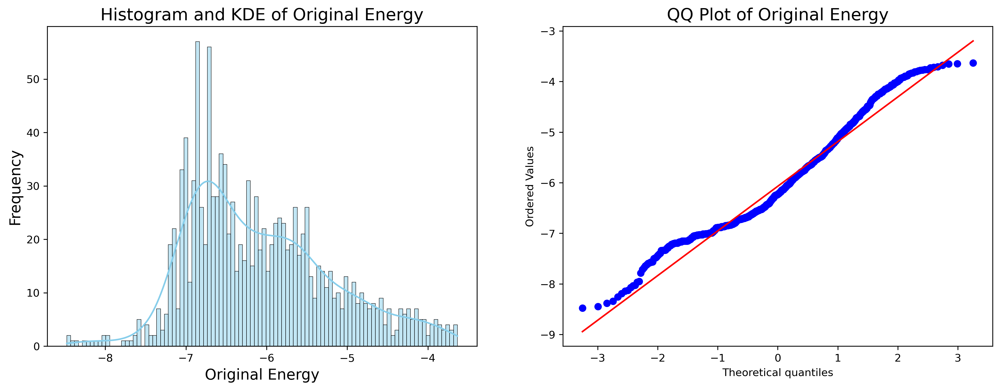

In [55]:
# Visualize the distributions and QQ Plots
from scipy.stats import probplot
plt.figure(figsize=(16, 12),dpi = 300)

# Histogram and KDE for Original Energy
plt.subplot(2, 2, 1)
sns.histplot(data[['energy_per_atom']].values.flatten(), kde=True, bins=100, color='skyblue')
#sns.histplot(data[['formation_energy_per_atom']].values.flatten(), kde=True, bins=50, color='skyblue')

plt.title('Histogram and KDE of Original Energy', fontsize=16)
plt.xlabel('Original Energy', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

# QQ Plot for Original Energy
plt.subplot(2, 2, 2)
probplot(data[['energy_per_atom']].values.flatten(), dist="norm", plot=plt)
#probplot(data[['formation_energy_per_atom']].values.flatten(), dist="norm", plot=plt)

plt.title('QQ Plot of Original Energy', fontsize=16)

In [56]:
# First, get numerical vs. categorical features

#Find numerical & cateogorical features for training data
#col_NonYr= [feature for feature in train.columns if feature not in col_year]

col = [feature for feature in data.columns]

col_num=[]
col_cat=[]

for c in col:    
    if (data[c].dtype!='O'):
        col_num.append(c)
    else:
        col_cat.append(c)



In [57]:
print(col_num)

['energy_per_atom', 'A_k', 'B_l', 'C_m', 'D_n', 'E_p', 'A_AtomicMass', 'B_AtomicMass', 'C_AtomicMass', 'D_AtomicMass', 'E_AtomicMass', 'A_AtomicNumber', 'B_AtomicNumber', 'C_AtomicNumber', 'D_AtomicNumber', 'E_AtomicNumber', 'A_AtomicRadius', 'B_AtomicRadius', 'C_AtomicRadius', 'D_AtomicRadius', 'E_AtomicRadius', 'A_BoilingPoint', 'B_BoilingPoint', 'C_BoilingPoint', 'D_BoilingPoint', 'E_BoilingPoint', 'A_Density', 'B_Density', 'C_Density', 'D_Density', 'E_Density', 'A_Electronegativity', 'B_Electronegativity', 'C_Electronegativity', 'D_Electronegativity', 'E_Electronegativity', 'A_Electrons', 'B_Electrons', 'C_Electrons', 'D_Electrons', 'E_Electrons', 'A_FirstIonization', 'B_FirstIonization', 'C_FirstIonization', 'D_FirstIonization', 'E_FirstIonization', 'A_Group', 'B_Group', 'C_Group', 'D_Group', 'E_Group', 'A_MassNumber', 'B_MassNumber', 'C_MassNumber', 'D_MassNumber', 'E_MassNumber', 'A_MeltingPoint', 'B_MeltingPoint', 'C_MeltingPoint', 'D_MeltingPoint', 'E_MeltingPoint', 'A_Metallo

In [58]:
print(col_cat)

['A_Phase', 'B_Phase', 'C_Phase', 'D_Phase', 'E_Phase', 'A_Type', 'B_Type', 'C_Type', 'D_Type', 'E_Type']


In [59]:
data

,energy_per_atom,A_k,B_l,C_m,D_n,E_p,A_AtomicMass,B_AtomicMass,C_AtomicMass,D_AtomicMass,E_AtomicMass,A_AtomicNumber,B_AtomicNumber,C_AtomicNumber,D_AtomicNumber,E_AtomicNumber,A_AtomicRadius,B_AtomicRadius,C_AtomicRadius,D_AtomicRadius,E_AtomicRadius,A_BoilingPoint,B_BoilingPoint,C_BoilingPoint,D_BoilingPoint,E_BoilingPoint,A_Density,B_Density,C_Density,D_Density,E_Density,A_Electronegativity,B_Electronegativity,C_Electronegativity,D_Electronegativity,E_Electronegativity,A_Electrons,B_Electrons,C_Electrons,D_Electrons,E_Electrons,A_FirstIonization,B_FirstIonization,C_FirstIonization,D_FirstIonization,E_FirstIonization,A_Group,B_Group,C_Group,D_Group,E_Group,A_MassNumber,B_MassNumber,C_MassNumber,D_MassNumber,E_MassNumber,A_MeltingPoint,B_MeltingPoint,C_MeltingPoint,D_MeltingPoint,E_MeltingPoint,A_Metalloid,B_Metalloid,C_Metalloid,D_Metalloid,E_Metalloid,A_Neutrons,B_Neutrons,C_Neutrons,D_Neutrons,E_Neutrons,A_Period,B_Period,C_Period,D_Period,E_Period,A_Phase,B_Phase,C_Phase,D_Phase,E_Phase,A_Protons,B_Protons,C_Protons,D_Protons,E_Protons,A_Shells,B_Shells,C_Shells,D_Shells,E_Shells,A_SpecificHeat,B_SpecificHeat,C_SpecificHeat,D_SpecificHeat,E_SpecificHeat,A_Type,B_Type,C_Type,D_Type,E_Type,A_Valence,B_Valence,C_Valence,D_Valence,E_Valence,Weighted_AtomicMass,Weighted_AtomicNumber,Weighted_AtomicRadius,Weighted_BoilingPoint,Weighted_Density,Weighted_Electronegativity,Weighted_FirstIonization,Weighted_MassNumber,Weighted_MeltingPoint,Weighted_SpecificHeat,AddA_kB_lC_mD_nE_p,SubA_kB_lC_mD_nE_p_square,DivA_kB_l,DivA_kC_m,DivA_kD_n,DivA_kE_p,DivB_lC_m,DivB_lD_n,DivB_lE_p,DivC_mD_n,DivC_mE_p,ASubWAM_square,BSubWAM_square,CSubWAM_square,DSubWAM_square,ESubWAM_square,ASubWAN_square,BSubWAN_square,CSubWAN_square,DSubWAN_square,ESubWAN_square,ASubWAR_square,BSubWAR_square,CSubWAR_square,DSubWAR_square,ESubWAR_square,ASubWBP_square,BSubWBP_square,CSubWBP_square,DSubWBP_square,ESubWBP_square,ASubWD_square,BSubWD_square,CSubWD_square,DSubWD_square,ESubWD_square,ASubWE_square,BSubWE_square,CSubWE_square,DSubWE_square,ESubWE_square,ASubWFI_square,BSubWFI_square,CSubWFI_square,DSubWFI_square,ESubWFI_square,ASubWMN_square,BSubWMN_square,CSubWMN_square,DSubWMN_square,ESubWMN_square,ASubWMP_square,BSubWMP_square,CSubWMP_square,ESubWMP_square,DSubWMP_square,ASubWSH_square,BSubWSH_square,CSubWSH_square,DSubWSH_square,ESubWSH_square,Encoded_1,Encoded_2,Encoded_3,Encoded_4,Encoded_5,Encoded_6,Encoded_7,Encoded_8,Encoded_9,Encoded_10,Encoded_11,Encoded_12,Encoded_13,Encoded_14,Encoded_15,Encoded_16,Encoded_17,Encoded_18,Encoded_19,Encoded_20,Encoded_21,Encoded_22,Encoded_23,Encoded_24,Encoded_25,Encoded_26,Encoded_27,Encoded_28,Encoded_29,Encoded_30
0,-4.742910,4,4,4,4,4,200.590,12.011,32.065,14.007,35.453,80,6,16,7,17,1.8,0.91,1.10,0.75,0.97,630.0,4300.0,717.80,77.36,239.11,13.500,2.27,2.07000,0.00125,0.00321,2.00,2.55,2.58,3.04,3.16,80,6,16,7,17,10.4375,11.2603,10.3600,14.5341,12.9676,12,14,16,15,17,201,12,32,14,35,234.43,3948.15,388.510,63.29,172.31,False,False,False,False,False,121,6,16,7,18,6,2,3,2,3,liq,solid,solid,gas,gas,80,6,16,7,17,6,2,3,2,3,0.140,0.709,0.710,1.040,0.479,Transition Metal,Nonmetal,Nonmetal,Nonmetal,Halogen,0,4,6,5,7,58.825200,25.200000,1.106000,1192.854000,3.568892,2.666000,11.911900,58.800000,961.338000,0.615600,20,144,1.0,1.000000,1.00,1.00,1.000000,1.00,1.0,1.00,1.00,20097.258519,2191.569322,716.108304,2008.671051,546.259733,3003.040000,368.640000,84.640000,331.240000,67.240000,0.481636,0.038416,0.000036,0.126736,0.018496,3.168046e+05,9.654356e+06,2.256763e+05,1.244327e+06,9.096276e+05,98.626906,1.687120,2.246677,12.728069,12.714088,0.443556,0.013456,0.007396,0.139876,0.244036,2.173855,0.424583,2.408394,6.875933,1.114502,20220.840000,2190.240000,718.240000,2007.040000,566.440000,5.283952e+05,8.921046e+06,3.281319e+05,6.225652e+05,8.064902e+05,0.226195,0.008724,0.008911,0.180115,0.018660,0.000000,0.0,5.575090,0.0,0.0,20.903234,20.883892,0.0,0.000000,29.057568,2.097818,20.709497,40.347973,8.362555,23.658430,16.663408,5.8

In [60]:
data_encoded = data.copy()

In [61]:
# Convert Boolean features to integers
boolean_features = ['A_Metalloid', 'B_Metalloid', 'C_Metalloid',"D_Metalloid","E_Metalloid" ]
data_encoded[boolean_features] = data_encoded[boolean_features].astype(int)
data_encoded

,energy_per_atom,A_k,B_l,C_m,D_n,E_p,A_AtomicMass,B_AtomicMass,C_AtomicMass,D_AtomicMass,E_AtomicMass,A_AtomicNumber,B_AtomicNumber,C_AtomicNumber,D_AtomicNumber,E_AtomicNumber,A_AtomicRadius,B_AtomicRadius,C_AtomicRadius,D_AtomicRadius,E_AtomicRadius,A_BoilingPoint,B_BoilingPoint,C_BoilingPoint,D_BoilingPoint,E_BoilingPoint,A_Density,B_Density,C_Density,D_Density,E_Density,A_Electronegativity,B_Electronegativity,C_Electronegativity,D_Electronegativity,E_Electronegativity,A_Electrons,B_Electrons,C_Electrons,D_Electrons,E_Electrons,A_FirstIonization,B_FirstIonization,C_FirstIonization,D_FirstIonization,E_FirstIonization,A_Group,B_Group,C_Group,D_Group,E_Group,A_MassNumber,B_MassNumber,C_MassNumber,D_MassNumber,E_MassNumber,A_MeltingPoint,B_MeltingPoint,C_MeltingPoint,D_MeltingPoint,E_MeltingPoint,A_Metalloid,B_Metalloid,C_Metalloid,D_Metalloid,E_Metalloid,A_Neutrons,B_Neutrons,C_Neutrons,D_Neutrons,E_Neutrons,A_Period,B_Period,C_Period,D_Period,E_Period,A_Phase,B_Phase,C_Phase,D_Phase,E_Phase,A_Protons,B_Protons,C_Protons,D_Protons,E_Protons,A_Shells,B_Shells,C_Shells,D_Shells,E_Shells,A_SpecificHeat,B_SpecificHeat,C_SpecificHeat,D_SpecificHeat,E_SpecificHeat,A_Type,B_Type,C_Type,D_Type,E_Type,A_Valence,B_Valence,C_Valence,D_Valence,E_Valence,Weighted_AtomicMass,Weighted_AtomicNumber,Weighted_AtomicRadius,Weighted_BoilingPoint,Weighted_Density,Weighted_Electronegativity,Weighted_FirstIonization,Weighted_MassNumber,Weighted_MeltingPoint,Weighted_SpecificHeat,AddA_kB_lC_mD_nE_p,SubA_kB_lC_mD_nE_p_square,DivA_kB_l,DivA_kC_m,DivA_kD_n,DivA_kE_p,DivB_lC_m,DivB_lD_n,DivB_lE_p,DivC_mD_n,DivC_mE_p,ASubWAM_square,BSubWAM_square,CSubWAM_square,DSubWAM_square,ESubWAM_square,ASubWAN_square,BSubWAN_square,CSubWAN_square,DSubWAN_square,ESubWAN_square,ASubWAR_square,BSubWAR_square,CSubWAR_square,DSubWAR_square,ESubWAR_square,ASubWBP_square,BSubWBP_square,CSubWBP_square,DSubWBP_square,ESubWBP_square,ASubWD_square,BSubWD_square,CSubWD_square,DSubWD_square,ESubWD_square,ASubWE_square,BSubWE_square,CSubWE_square,DSubWE_square,ESubWE_square,ASubWFI_square,BSubWFI_square,CSubWFI_square,DSubWFI_square,ESubWFI_square,ASubWMN_square,BSubWMN_square,CSubWMN_square,DSubWMN_square,ESubWMN_square,ASubWMP_square,BSubWMP_square,CSubWMP_square,ESubWMP_square,DSubWMP_square,ASubWSH_square,BSubWSH_square,CSubWSH_square,DSubWSH_square,ESubWSH_square,Encoded_1,Encoded_2,Encoded_3,Encoded_4,Encoded_5,Encoded_6,Encoded_7,Encoded_8,Encoded_9,Encoded_10,Encoded_11,Encoded_12,Encoded_13,Encoded_14,Encoded_15,Encoded_16,Encoded_17,Encoded_18,Encoded_19,Encoded_20,Encoded_21,Encoded_22,Encoded_23,Encoded_24,Encoded_25,Encoded_26,Encoded_27,Encoded_28,Encoded_29,Encoded_30
0,-4.742910,4,4,4,4,4,200.590,12.011,32.065,14.007,35.453,80,6,16,7,17,1.8,0.91,1.10,0.75,0.97,630.0,4300.0,717.80,77.36,239.11,13.500,2.27,2.07000,0.00125,0.00321,2.00,2.55,2.58,3.04,3.16,80,6,16,7,17,10.4375,11.2603,10.3600,14.5341,12.9676,12,14,16,15,17,201,12,32,14,35,234.43,3948.15,388.510,63.29,172.31,0,0,0,0,0,121,6,16,7,18,6,2,3,2,3,liq,solid,solid,gas,gas,80,6,16,7,17,6,2,3,2,3,0.140,0.709,0.710,1.040,0.479,Transition Metal,Nonmetal,Nonmetal,Nonmetal,Halogen,0,4,6,5,7,58.825200,25.200000,1.106000,1192.854000,3.568892,2.666000,11.911900,58.800000,961.338000,0.615600,20,144,1.0,1.000000,1.00,1.00,1.000000,1.00,1.0,1.00,1.00,20097.258519,2191.569322,716.108304,2008.671051,546.259733,3003.040000,368.640000,84.640000,331.240000,67.240000,0.481636,0.038416,0.000036,0.126736,0.018496,3.168046e+05,9.654356e+06,2.256763e+05,1.244327e+06,9.096276e+05,98.626906,1.687120,2.246677,12.728069,12.714088,0.443556,0.013456,0.007396,0.139876,0.244036,2.173855,0.424583,2.408394,6.875933,1.114502,20220.840000,2190.240000,718.240000,2007.040000,566.440000,5.283952e+05,8.921046e+06,3.281319e+05,6.225652e+05,8.064902e+05,0.226195,0.008724,0.008911,0.180115,0.018660,0.000000,0.0,5.575090,0.0,0.0,20.903234,20.883892,0.0,0.000000,29.057568,2.097818,20.709497,40.347973,8.362555,23.658430,16.663408,5.874405,8.865588,10.77

In [62]:
# One-Hot Encoding
phase_features = ['A_Phase', 'B_Phase', 'C_Phase',"D_Phase","E_Phase"]
data_encoded = pd.get_dummies(data_encoded, columns=phase_features)

# Display the first few rows to verify the transformation
data_encoded.head()

,energy_per_atom,A_k,B_l,C_m,D_n,E_p,A_AtomicMass,B_AtomicMass,C_AtomicMass,D_AtomicMass,E_AtomicMass,A_AtomicNumber,B_AtomicNumber,C_AtomicNumber,D_AtomicNumber,E_AtomicNumber,A_AtomicRadius,B_AtomicRadius,C_AtomicRadius,D_AtomicRadius,E_AtomicRadius,A_BoilingPoint,B_BoilingPoint,C_BoilingPoint,D_BoilingPoint,E_BoilingPoint,A_Density,B_Density,C_Density,D_Density,E_Density,A_Electronegativity,B_Electronegativity,C_Electronegativity,D_Electronegativity,E_Electronegativity,A_Electrons,B_Electrons,C_Electrons,D_Electrons,E_Electrons,A_FirstIonization,B_FirstIonization,C_FirstIonization,D_FirstIonization,E_FirstIonization,A_Group,B_Group,C_Group,D_Group,E_Group,A_MassNumber,B_MassNumber,C_MassNumber,D_MassNumber,E_MassNumber,A_MeltingPoint,B_MeltingPoint,C_MeltingPoint,D_MeltingPoint,E_MeltingPoint,A_Metalloid,B_Metalloid,C_Metalloid,D_Metalloid,E_Metalloid,A_Neutrons,B_Neutrons,C_Neutrons,D_Neutrons,E_Neutrons,A_Period,B_Period,C_Period,D_Period,E_Period,A_Protons,B_Protons,C_Protons,D_Protons,E_Protons,A_Shells,B_Shells,C_Shells,D_Shells,E_Shells,A_SpecificHeat,B_SpecificHeat,C_SpecificHeat,D_SpecificHeat,E_SpecificHeat,A_Type,B_Type,C_Type,D_Type,E_Type,A_Valence,B_Valence,C_Valence,D_Valence,E_Valence,Weighted_AtomicMass,Weighted_AtomicNumber,Weighted_AtomicRadius,Weighted_BoilingPoint,Weighted_Density,Weighted_Electronegativity,Weighted_FirstIonization,Weighted_MassNumber,Weighted_MeltingPoint,Weighted_SpecificHeat,AddA_kB_lC_mD_nE_p,SubA_kB_lC_mD_nE_p_square,DivA_kB_l,DivA_kC_m,DivA_kD_n,DivA_kE_p,DivB_lC_m,DivB_lD_n,DivB_lE_p,DivC_mD_n,DivC_mE_p,ASubWAM_square,BSubWAM_square,CSubWAM_square,DSubWAM_square,ESubWAM_square,ASubWAN_square,BSubWAN_square,CSubWAN_square,DSubWAN_square,ESubWAN_square,ASubWAR_square,BSubWAR_square,CSubWAR_square,DSubWAR_square,ESubWAR_square,ASubWBP_square,BSubWBP_square,CSubWBP_square,DSubWBP_square,ESubWBP_square,ASubWD_square,BSubWD_square,CSubWD_square,DSubWD_square,ESubWD_square,ASubWE_square,BSubWE_square,CSubWE_square,DSubWE_square,ESubWE_square,ASubWFI_square,BSubWFI_square,CSubWFI_square,DSubWFI_square,ESubWFI_square,ASubWMN_square,BSubWMN_square,CSubWMN_square,DSubWMN_square,ESubWMN_square,ASubWMP_square,BSubWMP_square,CSubWMP_square,ESubWMP_square,DSubWMP_square,ASubWSH_square,BSubWSH_square,CSubWSH_square,DSubWSH_square,ESubWSH_square,Encoded_1,Encoded_2,Encoded_3,Encoded_4,Encoded_5,Encoded_6,Encoded_7,Encoded_8,Encoded_9,Encoded_10,Encoded_11,Encoded_12,Encoded_13,Encoded_14,Encoded_15,Encoded_16,Encoded_17,Encoded_18,Encoded_19,Encoded_20,Encoded_21,Encoded_22,Encoded_23,Encoded_24,Encoded_25,Encoded_26,Encoded_27,Encoded_28,Encoded_29,Encoded_30,A_Phase_gas,A_Phase_liq,A_Phase_solid,B_Phase_gas,B_Phase_liq,B_Phase_solid,C_Phase_gas,C_Phase_liq,C_Phase_solid,D_Phase_gas,D_Phase_liq,D_Phase_solid,E_Phase_gas,E_Phase_liq,E_Phase_solid
0,-4.742910,4,4,4,4,4,200.590,12.011,32.065,14.007,35.453,80,6,16,7,17,1.8,0.91,1.1,0.75,0.97,630.0,4300.0,717.8,77.36,239.11,13.50,2.27,2.07,0.00125,0.00321,2.00,2.55,2.58,3.04,3.16,80,6,16,7,17,10.4375,11.2603,10.360,14.5341,12.9676,12,14,16,15,17,201,12,32,14,35,234.43,3948.15,388.51,63.29,172.31,0,0,0,0,0,121,6,16,7,18,6,2,3,2,3,80,6,16,7,17,6,2,3,2,3,0.140,0.709,0.710,1.040,0.479,Transition Metal,Nonmetal,Nonmetal,Nonmetal,Halogen,0,4,6,5,7,58.825200,25.2,1.106000,1192.854000,3.568892,2.666000,11.91190,58.800000,961.338000,0.6156,20,144,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,20097.258519,2191.569322,716.108304,2008.671051,546.259733,3003.04,368.64,84.64,331.24,67.24,0.481636,0.038416,0.000036,0.126736,0.018496,3.168046e+05,9.654356e+06,2.256763e+05,1.244327e+06,9.096276e+05,98.626906,1.687120,2.246677,12.728069,12.714088,0.443556,0.013456,0.007396,0.139876,0.244036,2.173855,0.424583,2.408394,6.875933,1.114502,20220.840000,2190.240000,718.240000,2007.040000,566.440000,528395.240464,8.921046e+06,3.281319e+05,6.225652e+05,8.064902e+05,0.226195,0.008724,0.008911,0.180115,0.018660,0.00000,0.0,5.575090,0.0,0.0,20.903234,20.883892,0.0,0.000000,29.057568,2.0978

In [63]:
# Analyze unique values in A_Type, B_Type, C_Type, D_Type, E_Type to determine suitable encoding
type_features = ['A_Type', 'B_Type', 'C_Type',"D_Type","E_Type"]

# One-Hot Encoding
data_encoded = pd.get_dummies(data_encoded, columns=type_features)

# Display the first few rows to verify the transformation
data_encoded.head()

,energy_per_atom,A_k,B_l,C_m,D_n,E_p,A_AtomicMass,B_AtomicMass,C_AtomicMass,D_AtomicMass,E_AtomicMass,A_AtomicNumber,B_AtomicNumber,C_AtomicNumber,D_AtomicNumber,E_AtomicNumber,A_AtomicRadius,B_AtomicRadius,C_AtomicRadius,D_AtomicRadius,E_AtomicRadius,A_BoilingPoint,B_BoilingPoint,C_BoilingPoint,D_BoilingPoint,E_BoilingPoint,A_Density,B_Density,C_Density,D_Density,E_Density,A_Electronegativity,B_Electronegativity,C_Electronegativity,D_Electronegativity,E_Electronegativity,A_Electrons,B_Electrons,C_Electrons,D_Electrons,E_Electrons,A_FirstIonization,B_FirstIonization,C_FirstIonization,D_FirstIonization,E_FirstIonization,A_Group,B_Group,C_Group,D_Group,E_Group,A_MassNumber,B_MassNumber,C_MassNumber,D_MassNumber,E_MassNumber,A_MeltingPoint,B_MeltingPoint,C_MeltingPoint,D_MeltingPoint,E_MeltingPoint,A_Metalloid,B_Metalloid,C_Metalloid,D_Metalloid,E_Metalloid,A_Neutrons,B_Neutrons,C_Neutrons,D_Neutrons,E_Neutrons,A_Period,B_Period,C_Period,D_Period,E_Period,A_Protons,B_Protons,C_Protons,D_Protons,E_Protons,A_Shells,B_Shells,C_Shells,D_Shells,E_Shells,A_SpecificHeat,B_SpecificHeat,C_SpecificHeat,D_SpecificHeat,E_SpecificHeat,A_Valence,B_Valence,C_Valence,D_Valence,E_Valence,Weighted_AtomicMass,Weighted_AtomicNumber,Weighted_AtomicRadius,Weighted_BoilingPoint,Weighted_Density,Weighted_Electronegativity,Weighted_FirstIonization,Weighted_MassNumber,Weighted_MeltingPoint,Weighted_SpecificHeat,AddA_kB_lC_mD_nE_p,SubA_kB_lC_mD_nE_p_square,DivA_kB_l,DivA_kC_m,DivA_kD_n,DivA_kE_p,DivB_lC_m,DivB_lD_n,DivB_lE_p,DivC_mD_n,DivC_mE_p,ASubWAM_square,BSubWAM_square,CSubWAM_square,DSubWAM_square,ESubWAM_square,ASubWAN_square,BSubWAN_square,CSubWAN_square,DSubWAN_square,ESubWAN_square,ASubWAR_square,BSubWAR_square,CSubWAR_square,DSubWAR_square,ESubWAR_square,ASubWBP_square,BSubWBP_square,CSubWBP_square,DSubWBP_square,ESubWBP_square,ASubWD_square,BSubWD_square,CSubWD_square,DSubWD_square,ESubWD_square,ASubWE_square,BSubWE_square,CSubWE_square,DSubWE_square,ESubWE_square,ASubWFI_square,BSubWFI_square,CSubWFI_square,DSubWFI_square,ESubWFI_square,ASubWMN_square,BSubWMN_square,CSubWMN_square,DSubWMN_square,ESubWMN_square,ASubWMP_square,BSubWMP_square,CSubWMP_square,ESubWMP_square,DSubWMP_square,ASubWSH_square,BSubWSH_square,CSubWSH_square,DSubWSH_square,ESubWSH_square,Encoded_1,Encoded_2,Encoded_3,Encoded_4,Encoded_5,Encoded_6,Encoded_7,Encoded_8,Encoded_9,Encoded_10,Encoded_11,Encoded_12,Encoded_13,Encoded_14,Encoded_15,Encoded_16,Encoded_17,Encoded_18,Encoded_19,Encoded_20,Encoded_21,Encoded_22,Encoded_23,Encoded_24,Encoded_25,Encoded_26,Encoded_27,Encoded_28,Encoded_29,Encoded_30,A_Phase_gas,A_Phase_liq,A_Phase_solid,B_Phase_gas,B_Phase_liq,B_Phase_solid,C_Phase_gas,C_Phase_liq,C_Phase_solid,D_Phase_gas,D_Phase_liq,D_Phase_solid,E_Phase_gas,E_Phase_liq,E_Phase_solid,A_Type_Alkali Metal,A_Type_Alkaline Earth Metal,A_Type_Lanthanide,A_Type_Metal,A_Type_Metalloid,A_Type_Nonmetal,A_Type_Transition Metal,B_Type_Alkali Metal,B_Type_Alkaline Earth Metal,B_Type_Lanthanide,B_Type_Metal,B_Type_Metalloid,B_Type_Nonmetal,B_Type_Transition Metal,C_Type_Halogen,C_Type_Metal,C_Type_Metalloid,C_Type_Nonmetal,C_Type_Transition Metal,D_Type_Halogen,D_Type_Metal,D_Type_Metalloid,D_Type_Nonmetal,D_Type_Transition Metal,E_Type_Halogen,E_Type_Nonmetal,E_Type_Transition Metal
0,-4.742910,4,4,4,4,4,200.590,12.011,32.065,14.007,35.453,80,6,16,7,17,1.8,0.91,1.1,0.75,0.97,630.0,4300.0,717.8,77.36,239.11,13.50,2.27,2.07,0.00125,0.00321,2.00,2.55,2.58,3.04,3.16,80,6,16,7,17,10.4375,11.2603,10.360,14.5341,12.9676,12,14,16,15,17,201,12,32,14,35,234.43,3948.15,388.51,63.29,172.31,0,0,0,0,0,121,6,16,7,18,6,2,3,2,3,80,6,16,7,17,6,2,3,2,3,0.140,0.709,0.710,1.040,0.479,0,4,6,5,7,58.825200,25.2,1.106000,1192.854000,3.568892,2.666000,11.91190,58.800000,961.338000,0.6156,20,144,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,20097.258519,2191.569322,716.108304,2008.671051,546.259733,3003.04,368.64,84.64,331.24,67.24,0.481636,0.038416,0.000036,0.126736,0.018496,3.168046e+05,9.654356e+06,2.256763e+05,1.

In [64]:
data_encoded

,energy_per_atom,A_k,B_l,C_m,D_n,E_p,A_AtomicMass,B_AtomicMass,C_AtomicMass,D_AtomicMass,E_AtomicMass,A_AtomicNumber,B_AtomicNumber,C_AtomicNumber,D_AtomicNumber,E_AtomicNumber,A_AtomicRadius,B_AtomicRadius,C_AtomicRadius,D_AtomicRadius,E_AtomicRadius,A_BoilingPoint,B_BoilingPoint,C_BoilingPoint,D_BoilingPoint,E_BoilingPoint,A_Density,B_Density,C_Density,D_Density,E_Density,A_Electronegativity,B_Electronegativity,C_Electronegativity,D_Electronegativity,E_Electronegativity,A_Electrons,B_Electrons,C_Electrons,D_Electrons,E_Electrons,A_FirstIonization,B_FirstIonization,C_FirstIonization,D_FirstIonization,E_FirstIonization,A_Group,B_Group,C_Group,D_Group,E_Group,A_MassNumber,B_MassNumber,C_MassNumber,D_MassNumber,E_MassNumber,A_MeltingPoint,B_MeltingPoint,C_MeltingPoint,D_MeltingPoint,E_MeltingPoint,A_Metalloid,B_Metalloid,C_Metalloid,D_Metalloid,E_Metalloid,A_Neutrons,B_Neutrons,C_Neutrons,D_Neutrons,E_Neutrons,A_Period,B_Period,C_Period,D_Period,E_Period,A_Protons,B_Protons,C_Protons,D_Protons,E_Protons,A_Shells,B_Shells,C_Shells,D_Shells,E_Shells,A_SpecificHeat,B_SpecificHeat,C_SpecificHeat,D_SpecificHeat,E_SpecificHeat,A_Valence,B_Valence,C_Valence,D_Valence,E_Valence,Weighted_AtomicMass,Weighted_AtomicNumber,Weighted_AtomicRadius,Weighted_BoilingPoint,Weighted_Density,Weighted_Electronegativity,Weighted_FirstIonization,Weighted_MassNumber,Weighted_MeltingPoint,Weighted_SpecificHeat,AddA_kB_lC_mD_nE_p,SubA_kB_lC_mD_nE_p_square,DivA_kB_l,DivA_kC_m,DivA_kD_n,DivA_kE_p,DivB_lC_m,DivB_lD_n,DivB_lE_p,DivC_mD_n,DivC_mE_p,ASubWAM_square,BSubWAM_square,CSubWAM_square,DSubWAM_square,ESubWAM_square,ASubWAN_square,BSubWAN_square,CSubWAN_square,DSubWAN_square,ESubWAN_square,ASubWAR_square,BSubWAR_square,CSubWAR_square,DSubWAR_square,ESubWAR_square,ASubWBP_square,BSubWBP_square,CSubWBP_square,DSubWBP_square,ESubWBP_square,ASubWD_square,BSubWD_square,CSubWD_square,DSubWD_square,ESubWD_square,ASubWE_square,BSubWE_square,CSubWE_square,DSubWE_square,ESubWE_square,ASubWFI_square,BSubWFI_square,CSubWFI_square,DSubWFI_square,ESubWFI_square,ASubWMN_square,BSubWMN_square,CSubWMN_square,DSubWMN_square,ESubWMN_square,ASubWMP_square,BSubWMP_square,CSubWMP_square,ESubWMP_square,DSubWMP_square,ASubWSH_square,BSubWSH_square,CSubWSH_square,DSubWSH_square,ESubWSH_square,Encoded_1,Encoded_2,Encoded_3,Encoded_4,Encoded_5,Encoded_6,Encoded_7,Encoded_8,Encoded_9,Encoded_10,Encoded_11,Encoded_12,Encoded_13,Encoded_14,Encoded_15,Encoded_16,Encoded_17,Encoded_18,Encoded_19,Encoded_20,Encoded_21,Encoded_22,Encoded_23,Encoded_24,Encoded_25,Encoded_26,Encoded_27,Encoded_28,Encoded_29,Encoded_30,A_Phase_gas,A_Phase_liq,A_Phase_solid,B_Phase_gas,B_Phase_liq,B_Phase_solid,C_Phase_gas,C_Phase_liq,C_Phase_solid,D_Phase_gas,D_Phase_liq,D_Phase_solid,E_Phase_gas,E_Phase_liq,E_Phase_solid,A_Type_Alkali Metal,A_Type_Alkaline Earth Metal,A_Type_Lanthanide,A_Type_Metal,A_Type_Metalloid,A_Type_Nonmetal,A_Type_Transition Metal,B_Type_Alkali Metal,B_Type_Alkaline Earth Metal,B_Type_Lanthanide,B_Type_Metal,B_Type_Metalloid,B_Type_Nonmetal,B_Type_Transition Metal,C_Type_Halogen,C_Type_Metal,C_Type_Metalloid,C_Type_Nonmetal,C_Type_Transition Metal,D_Type_Halogen,D_Type_Metal,D_Type_Metalloid,D_Type_Nonmetal,D_Type_Transition Metal,E_Type_Halogen,E_Type_Nonmetal,E_Type_Transition Metal
0,-4.742910,4,4,4,4,4,200.590,12.011,32.065,14.007,35.453,80,6,16,7,17,1.8,0.91,1.10,0.75,0.97,630.0,4300.0,717.80,77.36,239.11,13.500,2.27,2.07000,0.00125,0.00321,2.00,2.55,2.58,3.04,3.16,80,6,16,7,17,10.4375,11.2603,10.3600,14.5341,12.9676,12,14,16,15,17,201,12,32,14,35,234.43,3948.15,388.510,63.29,172.31,0,0,0,0,0,121,6,16,7,18,6,2,3,2,3,80,6,16,7,17,6,2,3,2,3,0.140,0.709,0.710,1.040,0.479,0,4,6,5,7,58.825200,25.200000,1.106000,1192.854000,3.568892,2.666000,11.911900,58.800000,961.338000,0.615600,20,144,1.0,1.000000,1.00,1.00,1.000000,1.00,1.0,1.00,1.00,20097.258519,2191.569322,716.108304,2008.671051,546.259733,3003.040000,368.640000,84.640000,331.240000,67.240000,0.481636,0.038416,0.000036,0.126736

Column: energy_per_atom
Kurtosis: -0.1136
Skewness: 0.5586
Shapiro-Wilk Test: statistic=0.9638, p-value=0.0000
Probably not Gaussian (Normal distribution)
--------------------


((array([-3.2535517 , -2.9925648 , -2.84719146, ...,  2.84719146,
          2.9925648 ,  3.2535517 ]),
  array([-8.47714557, -8.4481714 , -8.38202867, ..., -3.65451884,
         -3.64686689, -3.63381808])),
 (0.8827180209157526, -6.0710305538678835, 0.9820253894822831))

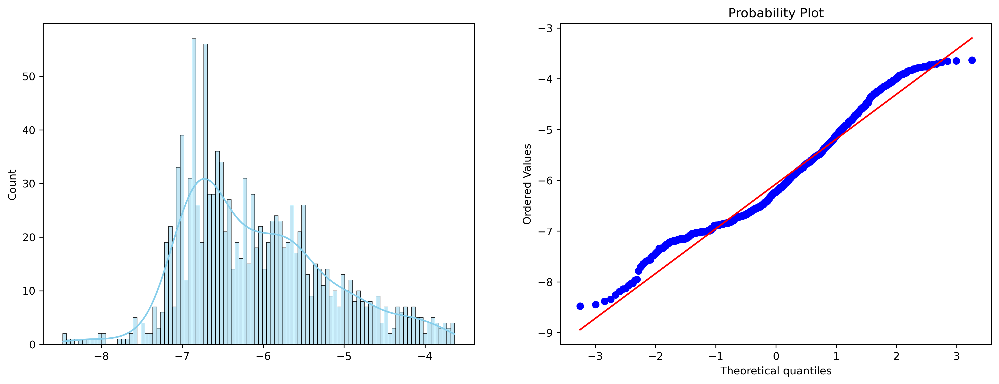

In [65]:
from scipy.stats import skew, kurtosis, shapiro

def check_distribution(df, column_name ):
  """
  ตรวจสอบ Kurtosis, Skewness และ Normality ของคอลัมน์ใน DataFrame

  Args:
    df: pandas DataFrame.

  Returns:
    พิมพ์ค่า Kurtosis, Skewness และผลการทดสอบ Shapiro-Wilk 
  """

  #column_name = input("กรุณาใส่ชื่อคอลัมน์ที่ต้องการตรวจสอบ: ")

  if column_name not in df.columns:
    print(f"Error: ไม่พบคอลัมน์ '{column_name}' ใน DataFrame")
    return

  data = df[column_name]

  # คำนวณ Kurtosis 
  kurtosis_value = kurtosis(data)

  # คำนวณ Skewness
  skewness_value = skew(data)

  # ทดสอบ Normality ด้วย Shapiro-Wilk test
  stat, p = shapiro(data)

  print(f"Column: {column_name}")
  print(f"Kurtosis: {kurtosis_value:.4f}")
  print(f"Skewness: {skewness_value:.4f}")
  print(f"Shapiro-Wilk Test: statistic={stat:.4f}, p-value={p:.4f}")
  if p > 0.05:
    print("Probably Gaussian (Normal distribution)")
  else:
    print("Probably not Gaussian (Normal distribution)")
  print("-" * 20)

# ตัวอย่างการใช้งาน

# เรียกใช้ function
check_distribution(data_encoded, "energy_per_atom")


# Visualize the distributions and QQ Plots
from scipy.stats import probplot
plt.figure(figsize=(16, 12),dpi = 300)

# Histogram and KDE for Original Energy
plt.subplot(2, 2, 1)
#sns.histplot(data[['energy_per_atom']].values.flatten(), kde=True, bins=100, color='skyblue')
sns.histplot(data_encoded[['energy_per_atom']].values.flatten(), kde=True, bins=100, color='skyblue')

#plt.title('Histogram and KDE of Original Energy', fontsize=16)
#plt.xlabel('Original Energy', fontsize=14)
#plt.ylabel('Frequency', fontsize=14)

# QQ Plot for Original Energy
plt.subplot(2, 2, 2)
#probplot(data[['energy_per_atom']].values.flatten(), dist="norm", plot=plt)
probplot(data_encoded[['energy_per_atom']].values.flatten(), dist="norm", plot=plt)

#plt.title('QQ Plot of Original Energy', fontsize=16)

## Part 3: Model Building and Training

In [66]:
data_copy = data_encoded.copy()
data_copy

,energy_per_atom,A_k,B_l,C_m,D_n,E_p,A_AtomicMass,B_AtomicMass,C_AtomicMass,D_AtomicMass,E_AtomicMass,A_AtomicNumber,B_AtomicNumber,C_AtomicNumber,D_AtomicNumber,E_AtomicNumber,A_AtomicRadius,B_AtomicRadius,C_AtomicRadius,D_AtomicRadius,E_AtomicRadius,A_BoilingPoint,B_BoilingPoint,C_BoilingPoint,D_BoilingPoint,E_BoilingPoint,A_Density,B_Density,C_Density,D_Density,E_Density,A_Electronegativity,B_Electronegativity,C_Electronegativity,D_Electronegativity,E_Electronegativity,A_Electrons,B_Electrons,C_Electrons,D_Electrons,E_Electrons,A_FirstIonization,B_FirstIonization,C_FirstIonization,D_FirstIonization,E_FirstIonization,A_Group,B_Group,C_Group,D_Group,E_Group,A_MassNumber,B_MassNumber,C_MassNumber,D_MassNumber,E_MassNumber,A_MeltingPoint,B_MeltingPoint,C_MeltingPoint,D_MeltingPoint,E_MeltingPoint,A_Metalloid,B_Metalloid,C_Metalloid,D_Metalloid,E_Metalloid,A_Neutrons,B_Neutrons,C_Neutrons,D_Neutrons,E_Neutrons,A_Period,B_Period,C_Period,D_Period,E_Period,A_Protons,B_Protons,C_Protons,D_Protons,E_Protons,A_Shells,B_Shells,C_Shells,D_Shells,E_Shells,A_SpecificHeat,B_SpecificHeat,C_SpecificHeat,D_SpecificHeat,E_SpecificHeat,A_Valence,B_Valence,C_Valence,D_Valence,E_Valence,Weighted_AtomicMass,Weighted_AtomicNumber,Weighted_AtomicRadius,Weighted_BoilingPoint,Weighted_Density,Weighted_Electronegativity,Weighted_FirstIonization,Weighted_MassNumber,Weighted_MeltingPoint,Weighted_SpecificHeat,AddA_kB_lC_mD_nE_p,SubA_kB_lC_mD_nE_p_square,DivA_kB_l,DivA_kC_m,DivA_kD_n,DivA_kE_p,DivB_lC_m,DivB_lD_n,DivB_lE_p,DivC_mD_n,DivC_mE_p,ASubWAM_square,BSubWAM_square,CSubWAM_square,DSubWAM_square,ESubWAM_square,ASubWAN_square,BSubWAN_square,CSubWAN_square,DSubWAN_square,ESubWAN_square,ASubWAR_square,BSubWAR_square,CSubWAR_square,DSubWAR_square,ESubWAR_square,ASubWBP_square,BSubWBP_square,CSubWBP_square,DSubWBP_square,ESubWBP_square,ASubWD_square,BSubWD_square,CSubWD_square,DSubWD_square,ESubWD_square,ASubWE_square,BSubWE_square,CSubWE_square,DSubWE_square,ESubWE_square,ASubWFI_square,BSubWFI_square,CSubWFI_square,DSubWFI_square,ESubWFI_square,ASubWMN_square,BSubWMN_square,CSubWMN_square,DSubWMN_square,ESubWMN_square,ASubWMP_square,BSubWMP_square,CSubWMP_square,ESubWMP_square,DSubWMP_square,ASubWSH_square,BSubWSH_square,CSubWSH_square,DSubWSH_square,ESubWSH_square,Encoded_1,Encoded_2,Encoded_3,Encoded_4,Encoded_5,Encoded_6,Encoded_7,Encoded_8,Encoded_9,Encoded_10,Encoded_11,Encoded_12,Encoded_13,Encoded_14,Encoded_15,Encoded_16,Encoded_17,Encoded_18,Encoded_19,Encoded_20,Encoded_21,Encoded_22,Encoded_23,Encoded_24,Encoded_25,Encoded_26,Encoded_27,Encoded_28,Encoded_29,Encoded_30,A_Phase_gas,A_Phase_liq,A_Phase_solid,B_Phase_gas,B_Phase_liq,B_Phase_solid,C_Phase_gas,C_Phase_liq,C_Phase_solid,D_Phase_gas,D_Phase_liq,D_Phase_solid,E_Phase_gas,E_Phase_liq,E_Phase_solid,A_Type_Alkali Metal,A_Type_Alkaline Earth Metal,A_Type_Lanthanide,A_Type_Metal,A_Type_Metalloid,A_Type_Nonmetal,A_Type_Transition Metal,B_Type_Alkali Metal,B_Type_Alkaline Earth Metal,B_Type_Lanthanide,B_Type_Metal,B_Type_Metalloid,B_Type_Nonmetal,B_Type_Transition Metal,C_Type_Halogen,C_Type_Metal,C_Type_Metalloid,C_Type_Nonmetal,C_Type_Transition Metal,D_Type_Halogen,D_Type_Metal,D_Type_Metalloid,D_Type_Nonmetal,D_Type_Transition Metal,E_Type_Halogen,E_Type_Nonmetal,E_Type_Transition Metal
0,-4.742910,4,4,4,4,4,200.590,12.011,32.065,14.007,35.453,80,6,16,7,17,1.8,0.91,1.10,0.75,0.97,630.0,4300.0,717.80,77.36,239.11,13.500,2.27,2.07000,0.00125,0.00321,2.00,2.55,2.58,3.04,3.16,80,6,16,7,17,10.4375,11.2603,10.3600,14.5341,12.9676,12,14,16,15,17,201,12,32,14,35,234.43,3948.15,388.510,63.29,172.31,0,0,0,0,0,121,6,16,7,18,6,2,3,2,3,80,6,16,7,17,6,2,3,2,3,0.140,0.709,0.710,1.040,0.479,0,4,6,5,7,58.825200,25.200000,1.106000,1192.854000,3.568892,2.666000,11.911900,58.800000,961.338000,0.615600,20,144,1.0,1.000000,1.00,1.00,1.000000,1.00,1.0,1.00,1.00,20097.258519,2191.569322,716.108304,2008.671051,546.259733,3003.040000,368.640000,84.640000,331.240000,67.240000,0.481636,0.038416,0.000036,0.126736

## Bayesian Optimization

In [67]:
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score


## KRR

In [2]:
#X = data_copy.drop(["energy_per_atom"], axis=1).values
#y = data_copy['energy_per_atom'].values.reshape(-1,1)

#print(X.shape, y.shape)

In [69]:
X

array([[4., 4., 4., ..., 1., 0., 0.],
       [4., 4., 4., ..., 1., 0., 0.],
       [4., 4., 4., ..., 1., 0., 0.],
       ...,
       [4., 2., 3., ..., 0., 1., 0.],
       [8., 4., 6., ..., 0., 1., 0.],
       [3., 2., 4., ..., 0., 1., 0.]])

In [70]:
y

array([[-4.74290967],
       [-6.11724044],
       [-5.720001  ],
       ...,
       [-5.57542009],
       [-5.7604582 ],
       [-5.75826822]])

In [71]:
y.reshape(-1,1)

array([[-4.74290967],
       [-6.11724044],
       [-5.720001  ],
       ...,
       [-5.57542009],
       [-5.7604582 ],
       [-5.75826822]])

In [72]:
# split datat train_test
X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [73]:
X_train

array([[ 2.,  1.,  1., ...,  1.,  0.,  0.],
       [ 2.,  2., 10., ...,  0.,  1.,  0.],
       [ 8.,  4.,  4., ...,  1.,  0.,  0.],
       ...,
       [ 3.,  1.,  2., ...,  0.,  1.,  0.],
       [ 4., 12.,  4., ...,  0.,  1.,  0.],
       [ 2.,  3.,  1., ...,  0.,  1.,  0.]])

In [75]:
# ใช้ Yeo-Johnson Transformation (standardize=True)
pt_X = PowerTransformer(method='yeo-johnson', standardize=True)
pt_y = PowerTransformer(method='yeo-johnson', standardize=True)

# Fit และแปลงข้อมูล Train
X_train = pt_X.fit_transform(X_train)
y_train = pt_y.fit_transform(y_train.reshape(-1, 1))

# แปลงข้อมูล Test
X_test = pt_X.transform(X_test)
# y_test_transformed = pt_y.transform(y_test.reshape(-1, 1))

In [76]:
X_train

array([[-0.74846854, -1.55114994, -1.56140111, ...,  1.45443618,
        -1.44081552, -0.06428243],
       [-0.74846854, -0.50406535,  1.28221235, ..., -0.68755165,
         0.69405138, -0.06428243],
       [ 1.26833348,  0.48538868,  0.27404461, ...,  1.45443618,
        -1.44081552, -0.06428243],
       ...,
       [-0.08839533, -1.55114994, -0.6400765 , ..., -0.68755165,
         0.69405138, -0.06428243],
       [ 0.35174866,  1.66311508,  0.27404461, ..., -0.68755165,
         0.69405138, -0.06428243],
       [-0.74846854,  0.09206299, -1.56140111, ..., -0.68755165,
         0.69405138, -0.06428243]])

In [78]:
X_test

array([[-0.74846854, -1.55114994, -1.56140111, ..., -0.68755165,
         0.69405138, -0.06428243],
       [ 0.35174866,  0.48538868,  0.27404461, ..., -0.68755165,
         0.69405138, -0.06428243],
       [ 0.35174866, -0.50406535, -0.6400765 , ..., -0.68755165,
         0.69405138, -0.06428243],
       ...,
       [ 0.35174866, -0.50406535, -0.6400765 , ..., -0.68755165,
         0.69405138, -0.06428243],
       [-0.74846854, -1.55114994, -0.09540135, ..., -0.68755165,
         0.69405138, -0.06428243],
       [-0.74846854, -0.50406535, -0.6400765 , ..., -0.68755165,
         0.69405138, -0.06428243]])

In [80]:
%%time

from sklearn.kernel_ridge import KernelRidge
from sklearn.model_selection import train_test_split
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer
import numpy as np

#data
X = data_copy.drop(["energy_per_atom"], axis=1).values
y = data_copy['energy_per_atom'].values.reshape(-1,1)

# split datat train_test
X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# ใช้ Yeo-Johnson Transformation (standardize=True)
pt_X = PowerTransformer(method='yeo-johnson', standardize=True)
pt_y = PowerTransformer(method='yeo-johnson', standardize=True)

# Fit และแปลงข้อมูล Train
X_train = pt_X.fit_transform(X_train)
y_train = pt_y.fit_transform(y_train.reshape(-1, 1))

# แปลงข้อมูล Test
X_test = pt_X.transform(X_test)
#y_test = pt_y.transform(y_test.reshape(-1, 1))
# Define the model
krr = KernelRidge()

#Use Bayesian Search to tune KRR
# Define the hyperparameter search space
param_space = {
    "alpha": Real(1e-6, 1e1, prior="log-uniform"),  # Regularization strength
    "kernel": Categorical(["rbf","poly"]),  # Kernel type
    "gamma": Real(1e-4, 1e1, prior="log-uniform"),  # Kernel coefficient for 'rbf' and 'poly'
    "degree": Integer(1, 4)  # Degree for 'poly' kernel
}

# Define the model
krr = KernelRidge()

# Create BayesSearchCV object
KRR_bayes_search = BayesSearchCV(
    estimator=krr,
    search_spaces=param_space,
    n_iter=30,  # Number of iterations for Bayesian optimization
    cv=5,  # Cross-validation folds
    n_jobs=-1,  # Use all available CPUs
    random_state=42
)

# Fit the model
KRR_bayes_search.fit(X_train, y_train)


CPU times: user 8.39 s, sys: 339 ms, total: 8.73 s
Wall time: 11.6 s


BayesSearchCV(cv=5, estimator=KernelRidge(), n_iter=30, n_jobs=-1,
              random_state=42,
              search_spaces={'alpha': Real(low=1e-06, high=10.0, prior='log-uniform', transform='normalize'),
                             'degree': Integer(low=1, high=4, prior='uniform', transform='normalize'),
                             'gamma': Real(low=0.0001, high=10.0, prior='log-uniform', transform='normalize'),
                             'kernel': Categorical(categories=('rbf', 'poly'), prior=None)})

In [81]:
#Take a look at the best score and the best parameters
best_score_KRR = -1*KRR_bayes_search.best_score_
#scores["KRR"] = best_score_KRR
print(f"best score is {best_score_KRR}")
print(f"best parameters are {KRR_bayes_search.best_params_}")

best score is -0.8590344730284929
best parameters are OrderedDict([('alpha', 0.0012996535162010368), ('degree', 4), ('gamma', 0.00033442273379111746), ('kernel', 'rbf')])


<AxesSubplot: title={'center': 'Convergence plot'}, xlabel='Number of calls $n$', ylabel='$\\min f(x)$ after $n$ calls'>

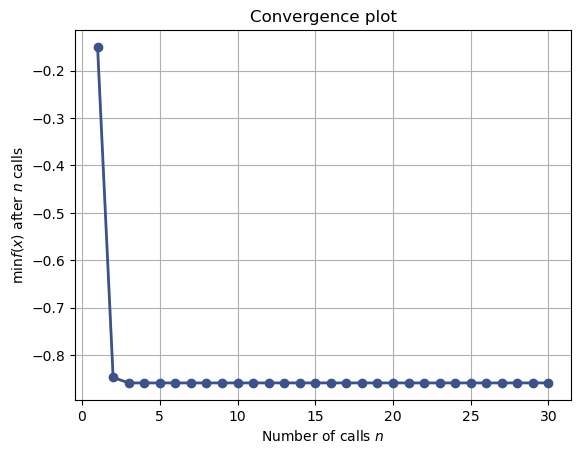

In [82]:
from skopt.plots import plot_objective, plot_histogram
from skopt.plots import plot_convergence
#plot_convergence(BayesSearchCV)
plot_convergence(KRR_bayes_search.optimizer_results_)

In [83]:
# Let's check Gradient Boost stability and do some visulization on prections
plt.figure(figsize=(20,5))

iterations=30
krr_scores_mse  = []
krr_scores_rmse = []
krr_scores_mae  = []
krr_scores_r2   = []

for i in range(iterations):
    X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.2, random_state=100+i)
    # ใช้ Yeo-Johnson Transformation (standardize=True)
    pt_X = PowerTransformer(method='yeo-johnson', standardize=True)
    pt_y = PowerTransformer(method='yeo-johnson', standardize=True)

    # Fit และแปลงข้อมูล Train
    X_train = pt_X.fit_transform(X_train)
    y_train = pt_y.fit_transform(y_train.reshape(-1, 1))

    # แปลงข้อมูล Test
    X_test = pt_X.transform(X_test)
    
    # prdict
    y_pred = KRR_bayes_search.predict(X_test)
    # แปลงคืนค่าพยากรณ์
    y_pred_original = pt_y.inverse_transform(y_pred.reshape(-1, 1))

    
    
    mse_test  = mean_squared_error(y_test, y_pred_original)
    rmse_test = np.sqrt(mse_test)
    mae_test  = mean_absolute_error(y_test, y_pred_original)
    r2_test   = r2_score(y_test, y_pred_original)
     
    krr_scores_mse.append(mse_test)
    krr_scores_rmse.append(rmse_test)
    krr_scores_mae.append(mae_test)
    krr_scores_r2.append(r2_test)

<Figure size 2000x500 with 0 Axes>

In [84]:
print("---")
print("krr_scores_mse_mean = ", np.mean(krr_scores_mse))
print("krr_scores_mse_std  = ",np.std(krr_scores_mse))
print("---")

print("---")
print("krr_scores_rmse_mean = ", np.mean(krr_scores_rmse))
print("krr_scores_rmse_std  = ",np.std(krr_scores_rmse))
print("---")

print("---")
print("krr_scores_mae_mean = ", np.mean(krr_scores_mae))
print("krr_scores_mae_std  = ",np.std(krr_scores_mae))
print("---")

print("---")
print("krr_scores_r2_mean = ", np.mean(krr_scores_r2))
print("krr_scores_r2_std  = ",np.std(krr_scores_r2))
print("---")


---
krr_scores_mse_mean =  0.024704923100697315
krr_scores_mse_std  =  0.0036793100551883694
---
---
krr_scores_rmse_mean =  0.15674276537086768
krr_scores_rmse_std  =  0.011688823918189668
---
---
krr_scores_mae_mean =  0.09778394702163036
krr_scores_mae_std  =  0.006595685978265836
---
---
krr_scores_r2_mean =  0.9698495621757756
krr_scores_r2_std  =  0.005147040069327134
---


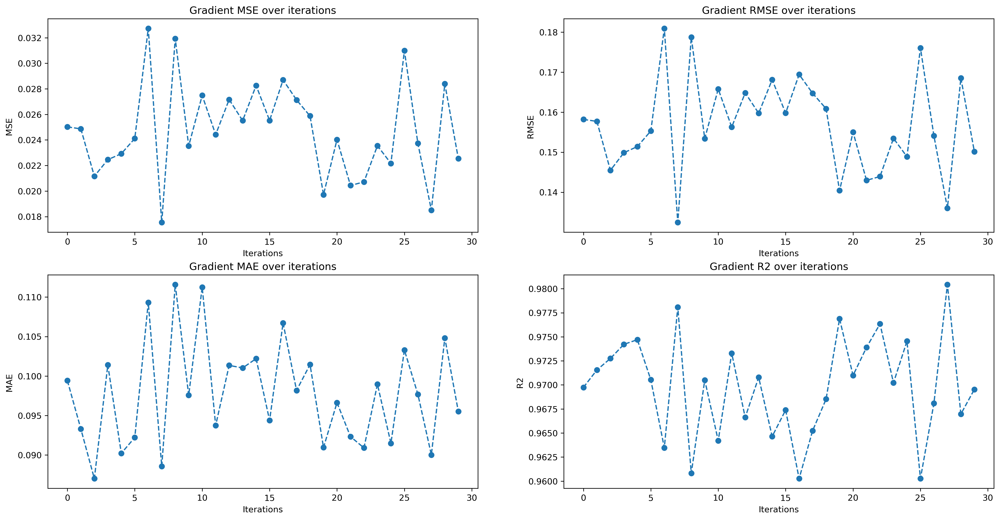

In [85]:
plt.figure(figsize=(20,10),dpi = 300)

### MSE
plt.subplot(2,2,1)
plt.plot(range(iterations), krr_scores_mse, marker = "o", linestyle = "dashed")
plt.title('Gradient MSE over iterations')
plt.xlabel("Iterations")
plt.ylabel("MSE ")
plt.grid(False)
### RMSE
plt.subplot(2,2,2)
plt.plot(range(iterations), krr_scores_rmse, marker = "o", linestyle = "dashed")
plt.title('Gradient RMSE over iterations')
plt.xlabel("Iterations")
plt.ylabel("RMSE ")
plt.grid(False)
### MAE
plt.subplot(2,2,3)
plt.plot(range(iterations), krr_scores_mae, marker = "o", linestyle = "dashed")
plt.title('Gradient MAE over iterations')
plt.xlabel("Iterations")
plt.ylabel("MAE ")
plt.grid(False)
### R2
plt.subplot(2,2,4)
plt.plot(range(iterations), krr_scores_r2, marker = "o", linestyle = "dashed")
plt.title('Gradient R2 over iterations')
plt.xlabel("Iterations")
plt.ylabel("R2 ")

#plt.legend()
plt.grid(False)
plt.show()

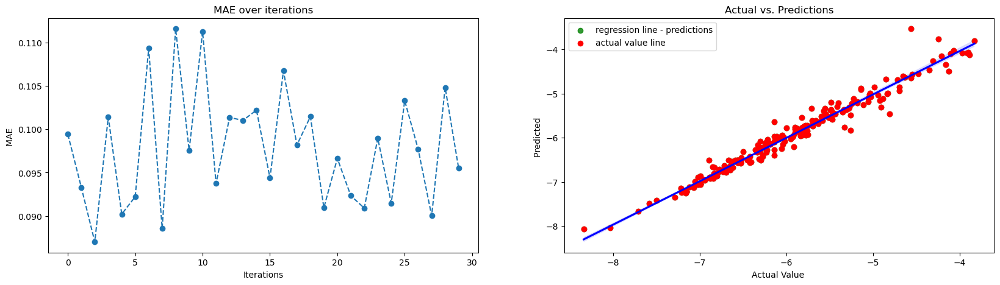

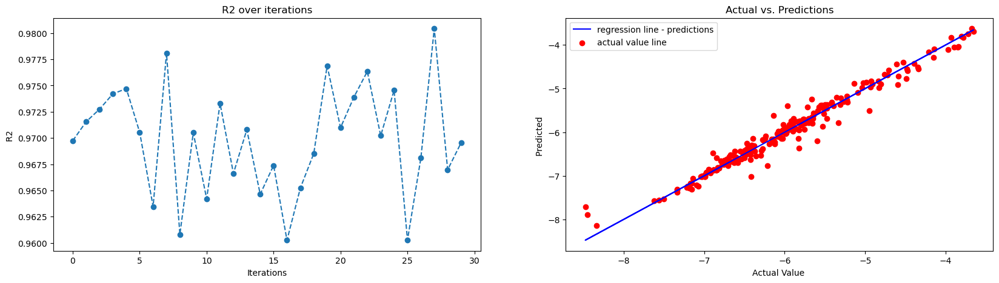

In [86]:
# Plot performance over iterations
plt.figure(figsize=(20,5))

### MSE
plt.subplot(1,2,1)
plt.plot(range(iterations), krr_scores_mae, marker = "o", linestyle = "dashed")
plt.title('MAE over iterations')
plt.xlabel("Iterations")
plt.ylabel("MAE ")

# Plot predicted vs. actual sale prices
plt.subplot(1,2,2)
sns.regplot(x=y_test, y=y_pred_original.reshape(-1, 1), color='b', scatter_kws={'color': 'g'}, label='regression line - predictions')
# plt.xlim(13, 14)  
plt.scatter(y_test, y_pred_original, color='r', label='actual value line')
plt.xlabel("Actual Value ")
plt.ylabel("Predicted ")
plt.title('Actual vs. Predictions')
plt.legend()
plt.grid(False)


###

###R2
plt.figure(figsize=(20,5))


X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.2, random_state=100)
# ใช้ Yeo-Johnson Transformation (standardize=True)
pt_X = PowerTransformer(method='yeo-johnson', standardize=True)
pt_y = PowerTransformer(method='yeo-johnson', standardize=True)

# Fit และแปลงข้อมูล Train
X_train = pt_X.fit_transform(X_train)
y_train = pt_y.fit_transform(y_train.reshape(-1, 1))

# แปลงข้อมูล Test
X_test = pt_X.transform(X_test)
    
# prdict
y_pred = KRR_bayes_search.predict(X_test)
# แปลงคืนค่าพยากรณ์
y_pred_original = pt_y.inverse_transform(y_pred.reshape(-1, 1))


plt.subplot(1,2,1)
plt.plot(range(iterations), krr_scores_r2, marker = "o", linestyle = "dashed")
plt.title('R2 over iterations')
plt.xlabel("Iterations")
plt.ylabel("R2 ")

# Plot predicted vs. actual sale prices
plt.subplot(1,2,2)
plt.plot(y_test, y_test, color='b', label='regression line - predictions')
# plt.xlim(13, 14)  
plt.scatter(y_test, y_pred_original, color='r', label='actual value line')
plt.xlabel("Actual Value ")
plt.ylabel("Predicted ")
plt.title('Actual vs. Predictions')
plt.legend()
plt.grid(False)
plt.show()
###

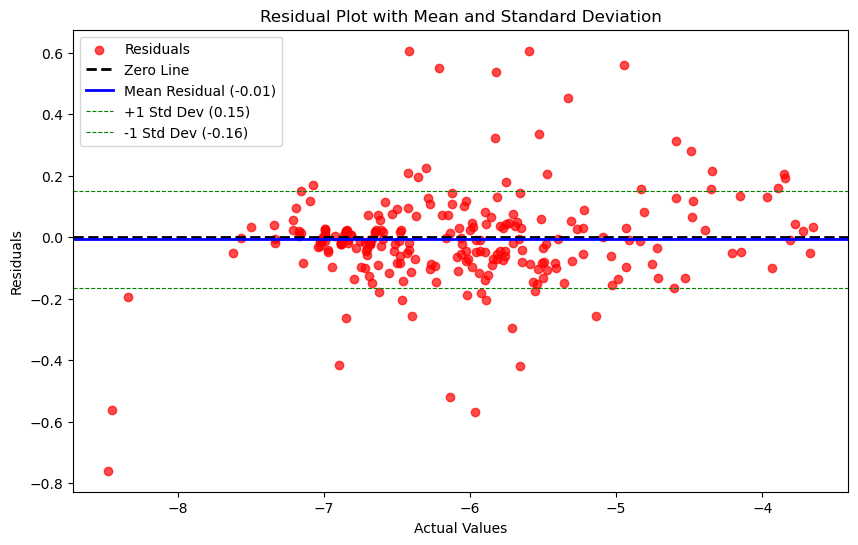

In [87]:
# Residual Plot (Scaled Values)
residuals_scaled = y_test - y_pred_original
plt.figure(figsize=(10, 6))
plt.scatter(y_test, residuals_scaled, alpha=0.7, color='red', label='Residuals')
plt.axhline(0, color='black', linewidth=2, linestyle='--', label='Zero Line')

# Add Mean and Std Dev Lines (Scaled Values)
mean_residual = np.mean(residuals_scaled)
std_residual = np.std(residuals_scaled)
plt.axhline(mean_residual, color='blue', linewidth=2, linestyle='-', label=f'Mean Residual ({mean_residual:.2f})')
plt.axhline(mean_residual + std_residual, color='green', linestyle='--', linewidth=0.8, label=f'+1 Std Dev ({mean_residual + std_residual:.2f})')
plt.axhline(mean_residual - std_residual, color='green', linestyle='--', linewidth=0.8, label=f'-1 Std Dev ({mean_residual - std_residual:.2f})')

plt.xlabel("Actual Values")
plt.ylabel("Residuals")
plt.title("Residual Plot with Mean and Standard Deviation")
plt.legend()
plt.grid(False)
plt.show()


## SVR

In [88]:
%%time
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer

#data
X = data_copy.drop(["energy_per_atom"], axis=1).values
y = data_copy['energy_per_atom'].values.reshape(-1,1)


# split datat train_test
X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# ใช้ Yeo-Johnson Transformation (standardize=True)
pt_X = PowerTransformer(method='yeo-johnson', standardize=True)
pt_y = PowerTransformer(method='yeo-johnson', standardize=True)

# Fit และแปลงข้อมูล Train
X_train = pt_X.fit_transform(X_train)
y_train = pt_y.fit_transform(y_train.reshape(-1, 1))


# แปลงข้อมูล Test
X_test = pt_X.transform(X_test)
#y_test = pt_y.transform(y_test.reshape(-1, 1))

# กำหนดพารามิเตอร์สำหรับการค้นหา
param_space = {
    'C': Real(1e-3, 1e3, 'log-uniform'),  # ใช้ log scale
    'epsilon': Real(1e-4, 1.0, 'log-uniform'),
    'kernel': Categorical(['poly', 'rbf']),  # ทดลอง kernel หลายแบบ
    'degree': Integer(2, 5)  # ใช้สำหรับ kernel 'poly'
}

# สร้างโมเดล SVR
svr = SVR()

# ใช้ BayesSearchCV ในการค้นหาพารามิเตอร์ที่ดีที่สุด
SVR_bayes_cv = BayesSearchCV(
    estimator=svr,
    search_spaces=param_space,
    n_iter=30,  # จำนวนครั้งในการทดลองค้นหาค่าพารามิเตอร์
    scoring='neg_mean_squared_error',  # ใช้ MSE เป็นตัววัดผล
    cv=5,  # จำนวน cross-validation folds
    n_jobs=-1,  # ใช้ทุก core ในการประมวลผล
    verbose=0,
    random_state=42
)

# ทำการค้นหาพารามิเตอร์ที่ดีที่สุด
SVR_bayes_cv.fit(pd.DataFrame(X_train),pd.DataFrame(y_train))

/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWar

/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWar

/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWar

/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWar

/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWar

CPU times: user 9.6 s, sys: 280 ms, total: 9.88 s
Wall time: 18.5 s


BayesSearchCV(cv=5, estimator=SVR(), n_iter=30, n_jobs=-1, random_state=42,
              scoring='neg_mean_squared_error',
              search_spaces={'C': Real(low=0.001, high=1000.0, prior='log-uniform', transform='normalize'),
                             'degree': Integer(low=2, high=5, prior='uniform', transform='normalize'),
                             'epsilon': Real(low=0.0001, high=1.0, prior='log-uniform', transform='normalize'),
                             'kernel': Categorical(categories=('poly', 'rbf'), prior=None)})

In [89]:
#Take a look at the best score and the best parameters
best_score_SVR = -1*SVR_bayes_cv.best_score_
#scores["KRR"] = best_score_KRR
print(f"best score is {best_score_SVR}")
print(f"best parameters are {SVR_bayes_cv.best_params_}")

best score is 0.1544324644281631
best parameters are OrderedDict([('C', 12.404973902905349), ('degree', 2), ('epsilon', 0.0001), ('kernel', 'rbf')])


<AxesSubplot: title={'center': 'Convergence plot'}, xlabel='Number of calls $n$', ylabel='$\\min f(x)$ after $n$ calls'>

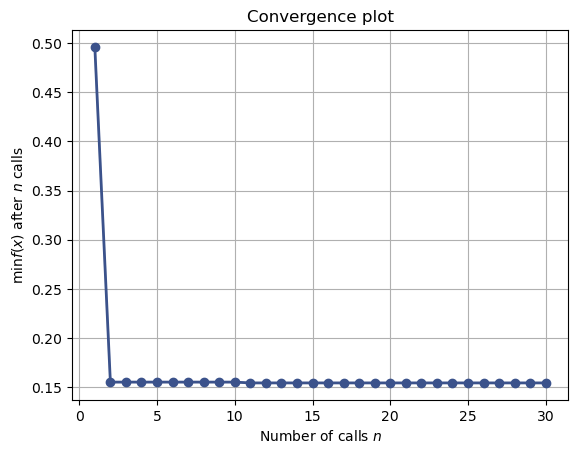

In [90]:
from skopt.plots import plot_objective, plot_histogram
from skopt.plots import plot_convergence
#plot_convergence(BayesSearchCV)
plot_convergence(SVR_bayes_cv.optimizer_results_)

In [91]:
# Let's check stability and do some visulization on prections
plt.figure(figsize=(20,5))

iterations=30
svr_scores_mse  = []
svr_scores_rmse = []
svr_scores_mae  = []
svr_scores_r2   = []

for i in range(iterations):
    X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.2, random_state=100+i)
    # ใช้ Yeo-Johnson Transformation (standardize=True)
    pt_X = PowerTransformer(method='yeo-johnson', standardize=True)
    pt_y = PowerTransformer(method='yeo-johnson', standardize=True)

    # Fit และแปลงข้อมูล Train
    X_train = pt_X.fit_transform(X_train)
    y_train = pt_y.fit_transform(y_train.reshape(-1, 1))

    # แปลงข้อมูล Test
    X_test = pt_X.transform(X_test)
    
    # prdict
    y_pred = SVR_bayes_cv.predict(X_test)
    # แปลงคืนค่าพยากรณ์
    y_pred_original = pt_y.inverse_transform(y_pred.reshape(-1, 1))


    mse_test  = mean_squared_error(y_test, y_pred_original)
    rmse_test = np.sqrt(mse_test)
    mae_test  = mean_absolute_error(y_test, y_pred_original)
    r2_test   = r2_score(y_test, y_pred_original)
     
    svr_scores_mse.append(mse_test)
    svr_scores_rmse.append(rmse_test)
    svr_scores_mae.append(mae_test)
    svr_scores_r2.append(r2_test)

<Figure size 2000x500 with 0 Axes>

In [92]:
print("---")
print("svr_scores_mse_mean = ", np.mean(svr_scores_mse))
print("svr_scores_mse_std  = ",np.std(svr_scores_mse))
print("---")

print("---")
print("svr_scores_rmse_mean = ", np.mean(svr_scores_rmse))
print("svr_scores_rmse_std  = ",np.std(svr_scores_rmse))
print("---")

print("---")
print("svr_scores_mae_mean = ", np.mean(svr_scores_mae))
print("svr_scores_mae_std  = ",np.std(svr_scores_mae))
print("---")

print("---")
print("svr_scores_r2_mean = ", np.mean(svr_scores_r2))
print("svr_scores_r2_std  = ",np.std(svr_scores_r2))
print("---")


---
svr_scores_mse_mean =  0.021426035905472037
svr_scores_mse_std  =  0.00514869487898844
---
---
svr_scores_rmse_mean =  0.14526283665584339
svr_scores_rmse_std  =  0.018020660148002455
---
---
svr_scores_mae_mean =  0.06586787632545581
svr_scores_mae_std  =  0.007319863850044534
---
---
svr_scores_r2_mean =  0.9738257306033691
svr_scores_r2_std  =  0.006817962493313657
---


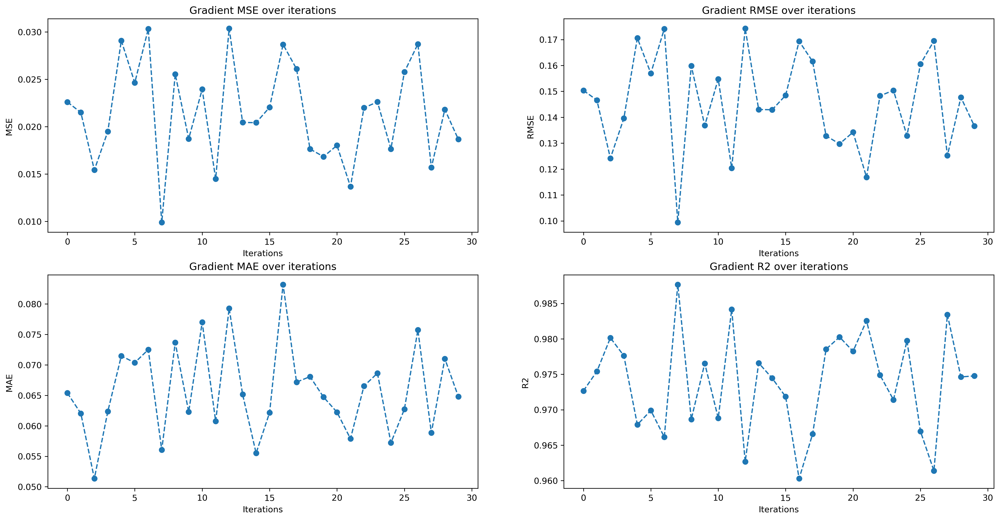

In [93]:
plt.figure(figsize=(20,10),dpi = 300)

### MSE
plt.subplot(2,2,1)
plt.plot(range(iterations), svr_scores_mse, marker = "o", linestyle = "dashed")
plt.title('Gradient MSE over iterations')
plt.xlabel("Iterations")
plt.ylabel("MSE ")
plt.grid(False)
### RMSE
plt.subplot(2,2,2)
plt.plot(range(iterations), svr_scores_rmse, marker = "o", linestyle = "dashed")
plt.title('Gradient RMSE over iterations')
plt.xlabel("Iterations")
plt.ylabel("RMSE ")
plt.grid(False)
### MAE
plt.subplot(2,2,3)
plt.plot(range(iterations), svr_scores_mae, marker = "o", linestyle = "dashed")
plt.title('Gradient MAE over iterations')
plt.xlabel("Iterations")
plt.ylabel("MAE ")
plt.grid(False)
### R2
plt.subplot(2,2,4)
plt.plot(range(iterations), svr_scores_r2, marker = "o", linestyle = "dashed")
plt.title('Gradient R2 over iterations')
plt.xlabel("Iterations")
plt.ylabel("R2 ")

#plt.legend()
plt.grid(False)
plt.show()

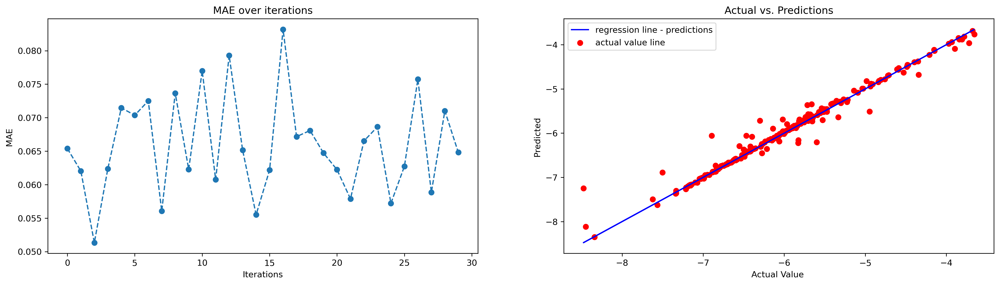

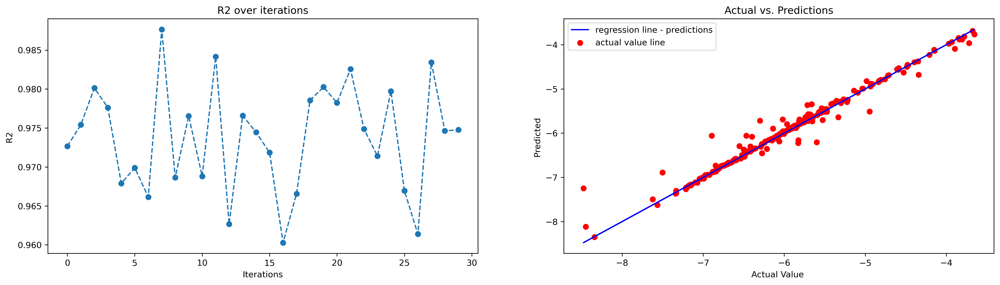

In [124]:
# Plot performance over iterations
plt.figure(figsize=(20,5),dpi = 300)

# Plot predicted vs. actual sale prices

X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.2, random_state=100)
# ใช้ Yeo-Johnson Transformation (standardize=True)
pt_X = PowerTransformer(method='yeo-johnson', standardize=True)
pt_y = PowerTransformer(method='yeo-johnson', standardize=True)

# Fit และแปลงข้อมูล Train
X_train = pt_X.fit_transform(X_train)
y_train = pt_y.fit_transform(y_train.reshape(-1, 1))

# แปลงข้อมูล Test
X_test = pt_X.transform(X_test)
    
# prdict
y_pred = SVR_bayes_cv.predict(X_test)
# แปลงคืนค่าพยากรณ์
y_pred_original = pt_y.inverse_transform(y_pred.reshape(-1, 1))


### MSE
plt.subplot(1,2,1)
plt.plot(range(iterations), svr_scores_mae, marker = "o", linestyle = "dashed")
plt.title('MAE over iterations')
plt.xlabel("Iterations")
plt.ylabel("MAE ")

# Plot predicted vs. actual sale prices
plt.subplot(1,2,2)
plt.plot(y_test, y_test, color='b', label='regression line - predictions')
# plt.xlim(13, 14)  
plt.scatter(y_test, y_pred_original, color='r', label='actual value line')
plt.xlabel("Actual Value ")
plt.ylabel("Predicted ")
plt.title('Actual vs. Predictions')
plt.legend()
plt.grid(False)
plt.show()
###

###

###R2
plt.figure(figsize=(20,5),dpi = 300)

#X = data_copy.drop(["energy_per_atom"], axis=1).values
#y = data_copy['energy_per_atom'].values.reshape(-1,1)

# Plot predicted vs. actual sale prices

X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.2, random_state=100)
# ใช้ Yeo-Johnson Transformation (standardize=True)
pt_X = PowerTransformer(method='yeo-johnson', standardize=True)
pt_y = PowerTransformer(method='yeo-johnson', standardize=True)

# Fit และแปลงข้อมูล Train
X_train = pt_X.fit_transform(X_train)
y_train = pt_y.fit_transform(y_train.reshape(-1, 1))

# แปลงข้อมูล Test
X_test = pt_X.transform(X_test)
    
# prdict
y_pred = SVR_bayes_cv.predict(X_test)
# แปลงคืนค่าพยากรณ์
y_pred_original = pt_y.inverse_transform(y_pred.reshape(-1, 1))


plt.subplot(1,2,1)
plt.plot(range(iterations), svr_scores_r2, marker = "o", linestyle = "dashed")
plt.title('R2 over iterations')
plt.xlabel("Iterations")
plt.ylabel("R2 ")

# Plot predicted vs. actual sale prices
plt.subplot(1,2,2)
plt.plot(y_test, y_test, color='b', label='regression line - predictions')
# plt.xlim(13, 14)  
plt.scatter(y_test, y_pred_original, color='r', label='actual value line')
plt.xlabel("Actual Value ")
plt.ylabel("Predicted ")
plt.title('Actual vs. Predictions')
plt.legend()
plt.grid(False)
plt.show()
###

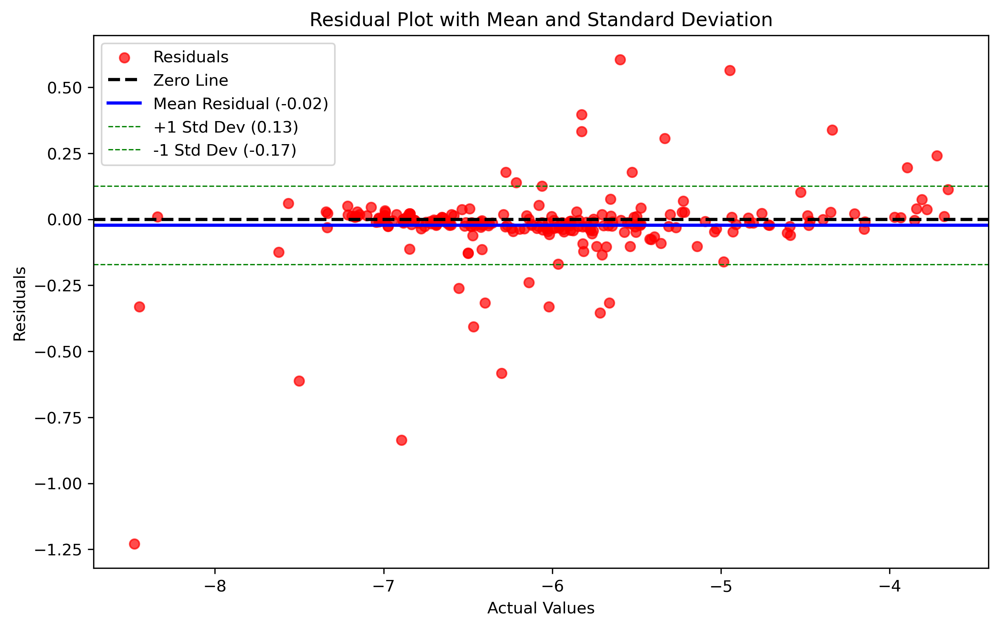

In [125]:
# Residual Plot (Scaled Values)
residuals_scaled = y_test - y_pred_original
plt.figure(figsize=(10, 6), dpi = 300)
plt.scatter(y_test, residuals_scaled, alpha=0.7, color='red', label='Residuals')
plt.axhline(0, color='black', linewidth=2, linestyle='--', label='Zero Line')

# Add Mean and Std Dev Lines (Scaled Values)
mean_residual = np.mean(residuals_scaled)
std_residual = np.std(residuals_scaled)
plt.axhline(mean_residual, color='blue', linewidth=2, linestyle='-', label=f'Mean Residual ({mean_residual:.2f})')
plt.axhline(mean_residual + std_residual, color='green', linestyle='--', linewidth=0.8, label=f'+1 Std Dev ({mean_residual + std_residual:.2f})')
plt.axhline(mean_residual - std_residual, color='green', linestyle='--', linewidth=0.8, label=f'-1 Std Dev ({mean_residual - std_residual:.2f})')

plt.xlabel("Actual Values")
plt.ylabel("Residuals")
plt.title("Residual Plot with Mean and Standard Deviation")
plt.legend()
plt.grid(False)
plt.show()




## LGBR

In [96]:
%%time
from sklearn.model_selection import train_test_split
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer

#data
X = data_copy.drop(["energy_per_atom"], axis=1).values
y = data_copy['energy_per_atom'].values.reshape(-1,1)

#X = data_copy.drop(["formation_energy_per_atom"], axis=1).values
#y = data_copy['formation_energy_per_atom'].values.reshape(-1,1)


# split datat train_test
X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# ใช้ Yeo-Johnson Transformation (standardize=True)
pt_X = PowerTransformer(method='yeo-johnson', standardize=True)
pt_y = PowerTransformer(method='yeo-johnson', standardize=True)

# Fit และแปลงข้อมูล Train
X_train = pt_X.fit_transform(X_train)
y_train = pt_y.fit_transform(y_train.reshape(-1, 1))


# แปลงข้อมูล Test
X_test = pt_X.transform(X_test)
#y_test = pt_y.transform(y_test.reshape(-1, 1))

# Define the model
LGBMR = LGBMRegressor(objective='regression',                                  
                                       feature_fraction_seed=7,
                                       verbose=-1,
                                       random_state=42)


#Use Bayesian Search to tune Gradient Boost
num_leaves= Categorical(list(range(5,11)))
learn_rate_list=Real(1e-4, 1e-1, prior='log-uniform')
n_estimators_list=Categorical([2500,5000,7500,10000])
max_bin=Categorical([200,250,300,350,400])
bagging_fraction=np.linspace(0.7,0.8,5)
bagging_freq=[5,6]
bagging_seed=[7,8]
feature_fraction=np.linspace(0.15,0.25,5)
feature_seed=[6,7]

params_space={"num_leaves":num_leaves,
        "learning_rate":learn_rate_list,
        "n_estimators":  n_estimators_list,
        "max_bin": max_bin,
        "bagging_fraction":bagging_fraction,
        "bagging_freq":bagging_freq,
        "bagging_seed":bagging_seed,
        "feature_fraction":feature_fraction,
        "feature_fraction_seed":feature_seed  }


# Create BayesSearchCV object
LGBMR_bayes_search = BayesSearchCV(
    estimator=LGBMR,
    search_spaces=params_space,
    n_iter=30,  # Number of iterations for Bayesian optimization
    cv=5,  # Cross-validation folds
    refit=True, 
    return_train_score=True,
    n_jobs=-1,  # Use all available CPUs
    random_state=42
)

LGBMR_bayes_search.fit(pd.DataFrame(X_train),pd.DataFrame(y_train))

CPU times: user 20.5 s, sys: 5.43 s, total: 26 s
Wall time: 14min 27s


BayesSearchCV(cv=5,
              estimator=LGBMRegressor(feature_fraction_seed=7,
                                      objective='regression', random_state=42,
                                      verbose=-1),
              n_iter=30, n_jobs=-1, random_state=42, return_train_score=True,
              search_spaces={'bagging_fraction': array([0.7  , 0.725, 0.75 , 0.775, 0.8  ]),
                             'bagging_freq': [5, 6], 'bagging_seed': [7, 8],
                             'feature_fraction': array([0.15 , 0.175, 0.2  , 0.225, 0.25 ]),
                             'feature_fraction_seed': [6, 7],
                             'learning_rate': Real(low=0.0001, high=0.1, prior='log-uniform', transform='normalize'),
                             'max_bin': Categorical(categories=(200, 250, 300, 350, 400), prior=None),
                             'n_estimators': Categorical(categories=(2500, 5000, 7500, 10000), prior=None),
                             'num_leaves': Categorical(categories=(5, 6, 7, 8, 9, 10), prior=None)})

In [97]:
#Take a look at the best score and the best parameters
best_score_LGBMR = -1*LGBMR_bayes_search.best_score_
#scores["KRR"] = best_score_KRR
print(f"best score is {best_score_LGBMR}")
print(f"best parameters are {LGBMR_bayes_search.best_params_}")

best score is -0.8507442462768159
best parameters are OrderedDict([('bagging_fraction', 0.775), ('bagging_freq', 6), ('bagging_seed', 7), ('feature_fraction', 0.25), ('feature_fraction_seed', 7), ('learning_rate', 0.012044196421265784), ('max_bin', 200), ('n_estimators', 5000), ('num_leaves', 9)])


<AxesSubplot: title={'center': 'Convergence plot'}, xlabel='Number of calls $n$', ylabel='$\\min f(x)$ after $n$ calls'>

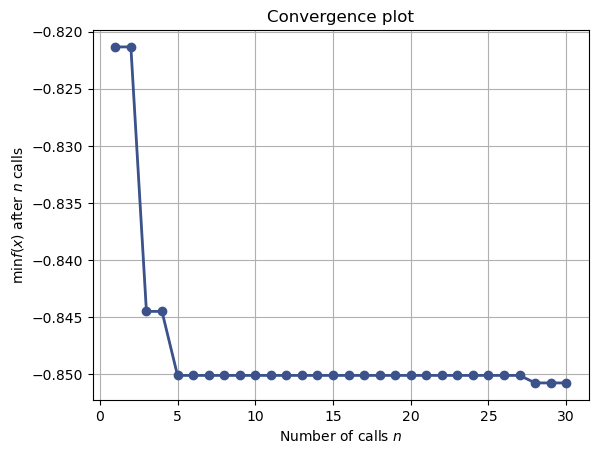

In [98]:
from skopt.plots import plot_objective, plot_histogram
from skopt.plots import plot_convergence
#plot_convergence(BayesSearchCV)
plot_convergence(LGBMR_bayes_search.optimizer_results_)

In [99]:
# Let's check stability and do some visulization on prections
plt.figure(figsize=(20,5))

iterations=30
lgbmr_scores_mse  = []
lgbmr_scores_rmse = []
lgbmr_scores_mae  = []
lgbmr_scores_r2   = []

for i in range(iterations):
    X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.2, random_state=100+i)
    # ใช้ Yeo-Johnson Transformation (standardize=True)
    pt_X = PowerTransformer(method='yeo-johnson', standardize=True)
    pt_y = PowerTransformer(method='yeo-johnson', standardize=True)

    # Fit และแปลงข้อมูล Train
    X_train = pt_X.fit_transform(X_train)
    y_train = pt_y.fit_transform(y_train.reshape(-1, 1))

    # แปลงข้อมูล Test
    X_test = pt_X.transform(X_test)
    
    # prdict
    y_pred = LGBMR_bayes_search.predict(X_test)
    # แปลงคืนค่าพยากรณ์
    y_pred_original = pt_y.inverse_transform(y_pred.reshape(-1, 1))

    
    
    mse_test  = mean_squared_error(y_test, y_pred_original)
    rmse_test = np.sqrt(mse_test)
    mae_test  = mean_absolute_error(y_test, y_pred_original)
    r2_test   = r2_score(y_test, y_pred_original)
     
    lgbmr_scores_mse.append(mse_test)
    lgbmr_scores_rmse.append(rmse_test)
    lgbmr_scores_mae.append(mae_test)
    lgbmr_scores_r2.append(r2_test)

<Figure size 2000x500 with 0 Axes>

In [100]:
print("---")
print("lgbmr_scores_mse_mean = ", np.mean(lgbmr_scores_mse))
print("lgbmr_scores_mse_std  = ",np.std(lgbmr_scores_mse))
print("---")

print("---")
print("lgbmr_scores_rmse_mean = ", np.mean(lgbmr_scores_rmse))
print("lgbmr_scores_rmse_std  = ",np.std(lgbmr_scores_rmse))
print("---")

print("---")
print("lgbmr_scores_mae_mean = ", np.mean(lgbmr_scores_mae))
print("lgbmr_scores_mae_std  = ",np.std(lgbmr_scores_mae))
print("---")

print("---")
print("lgbmr_scores_r2_mean = ", np.mean(lgbmr_scores_r2))
print("lgbmr_scores_r2_std  = ",np.std(lgbmr_scores_r2))
print("---")


---
lgbmr_scores_mse_mean =  0.02675250278082598
lgbmr_scores_mse_std  =  0.006246476121871666
---
---
lgbmr_scores_rmse_mean =  0.16245394984509814
lgbmr_scores_rmse_std  =  0.019005708630627904
---
---
lgbmr_scores_mae_mean =  0.09583060267017428
lgbmr_scores_mae_std  =  0.010383622294698582
---
---
lgbmr_scores_r2_mean =  0.9674431951182014
lgbmr_scores_r2_std  =  0.007592109738910428
---


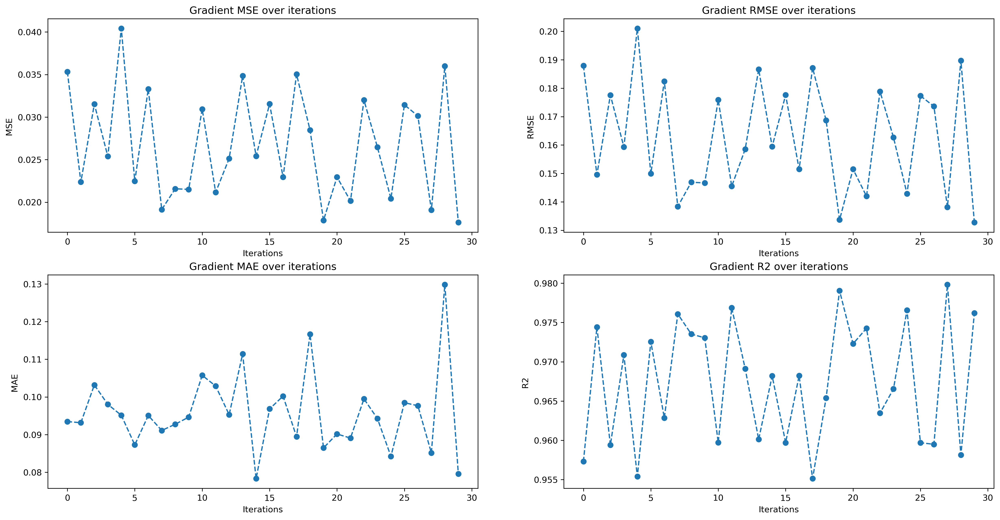

In [101]:
plt.figure(figsize=(20,10),dpi = 300)

### MSE
plt.subplot(2,2,1)
plt.plot(range(iterations), lgbmr_scores_mse, marker = "o", linestyle = "dashed")
plt.title('Gradient MSE over iterations')
plt.xlabel("Iterations")
plt.ylabel("MSE ")
plt.grid(False)
### RMSE
plt.subplot(2,2,2)
plt.plot(range(iterations), lgbmr_scores_rmse, marker = "o", linestyle = "dashed")
plt.title('Gradient RMSE over iterations')
plt.xlabel("Iterations")
plt.ylabel("RMSE ")
plt.grid(False)
### MAE
plt.subplot(2,2,3)
plt.plot(range(iterations), lgbmr_scores_mae, marker = "o", linestyle = "dashed")
plt.title('Gradient MAE over iterations')
plt.xlabel("Iterations")
plt.ylabel("MAE ")
plt.grid(False)
### R2
plt.subplot(2,2,4)
plt.plot(range(iterations), lgbmr_scores_r2, marker = "o", linestyle = "dashed")
plt.title('Gradient R2 over iterations')
plt.xlabel("Iterations")
plt.ylabel("R2 ")

#plt.legend()
plt.grid(False)
plt.show()

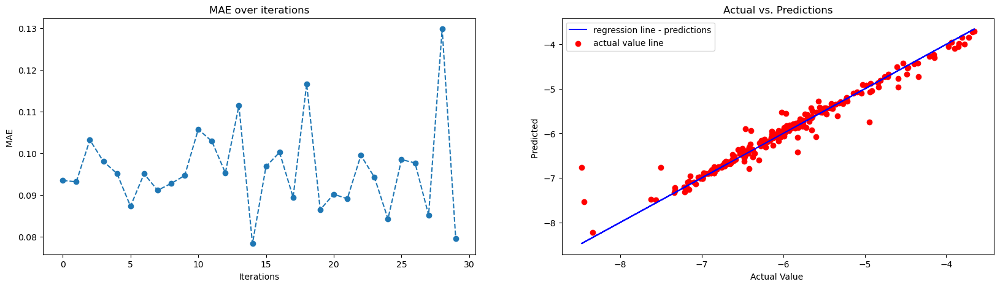

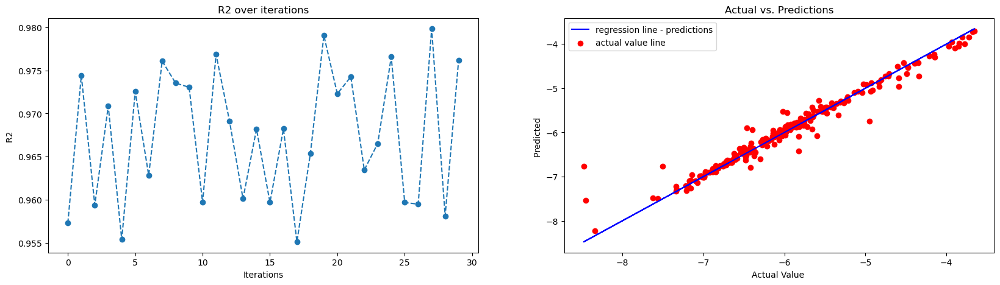

In [102]:
# Plot performance over iterations
plt.figure(figsize=(20,5))

# Plot predicted vs. actual sale prices

X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.2, random_state=100)
# ใช้ Yeo-Johnson Transformation (standardize=True)
pt_X = PowerTransformer(method='yeo-johnson', standardize=True)
pt_y = PowerTransformer(method='yeo-johnson', standardize=True)

# Fit และแปลงข้อมูล Train
X_train = pt_X.fit_transform(X_train)
y_train = pt_y.fit_transform(y_train.reshape(-1, 1))

# แปลงข้อมูล Test
X_test = pt_X.transform(X_test)
    
# prdict
y_pred = LGBMR_bayes_search.predict(X_test)
# แปลงคืนค่าพยากรณ์
y_pred_original = pt_y.inverse_transform(y_pred.reshape(-1, 1))


### MSE
plt.subplot(1,2,1)
plt.plot(range(iterations), lgbmr_scores_mae, marker = "o", linestyle = "dashed")
plt.title('MAE over iterations')
plt.xlabel("Iterations")
plt.ylabel("MAE ")

# Plot predicted vs. actual sale prices
plt.subplot(1,2,2)
plt.plot(y_test, y_test, color='b', label='regression line - predictions')
# plt.xlim(13, 14)  
plt.scatter(y_test, y_pred_original, color='r', label='actual value line')
plt.xlabel("Actual Value ")
plt.ylabel("Predicted ")
plt.title('Actual vs. Predictions')
plt.legend()
plt.grid(False)
plt.show()
###

###

###R2
plt.figure(figsize=(20,5))

#X = data_copy.drop(["energy_per_atom"], axis=1).values
#y = data_copy['energy_per_atom'].values.reshape(-1,1)

# Plot predicted vs. actual sale prices

X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.2, random_state=100)
# ใช้ Yeo-Johnson Transformation (standardize=True)
pt_X = PowerTransformer(method='yeo-johnson', standardize=True)
pt_y = PowerTransformer(method='yeo-johnson', standardize=True)

# Fit และแปลงข้อมูล Train
X_train = pt_X.fit_transform(X_train)
y_train = pt_y.fit_transform(y_train.reshape(-1, 1))

# แปลงข้อมูล Test
X_test = pt_X.transform(X_test)
    
# prdict
y_pred = LGBMR_bayes_search.predict(X_test)
# แปลงคืนค่าพยากรณ์
y_pred_original = pt_y.inverse_transform(y_pred.reshape(-1, 1))


plt.subplot(1,2,1)
plt.plot(range(iterations), lgbmr_scores_r2, marker = "o", linestyle = "dashed")
plt.title('R2 over iterations')
plt.xlabel("Iterations")
plt.ylabel("R2 ")

# Plot predicted vs. actual sale prices
plt.subplot(1,2,2)
plt.plot(y_test, y_test, color='b', label='regression line - predictions')
# plt.xlim(13, 14)  
plt.scatter(y_test, y_pred_original, color='r', label='actual value line')
plt.xlabel("Actual Value ")
plt.ylabel("Predicted ")
plt.title('Actual vs. Predictions')
plt.legend()
plt.grid(False)
plt.show()
###

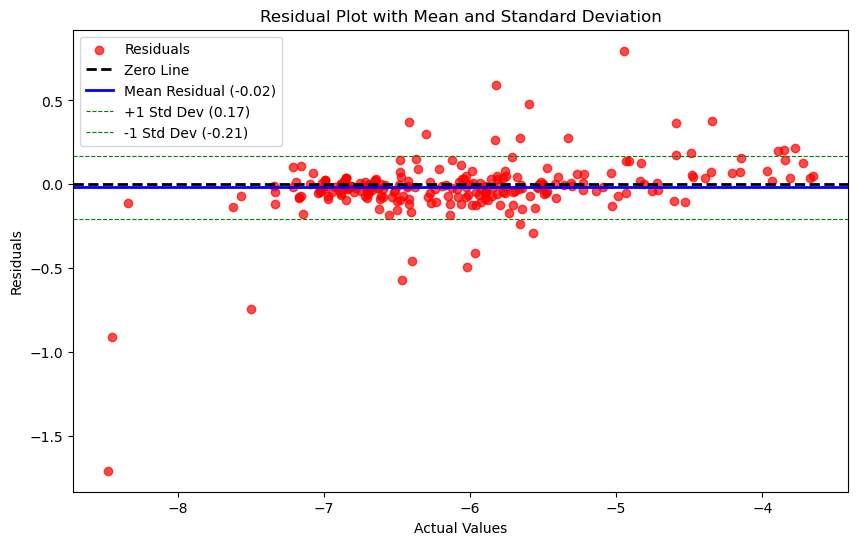

In [103]:
# Residual Plot (Scaled Values)
residuals_scaled = y_test - y_pred_original
plt.figure(figsize=(10, 6))
plt.scatter(y_test, residuals_scaled, alpha=0.7, color='red', label='Residuals')
plt.axhline(0, color='black', linewidth=2, linestyle='--', label='Zero Line')

# Add Mean and Std Dev Lines (Scaled Values)
mean_residual = np.mean(residuals_scaled)
std_residual = np.std(residuals_scaled)
plt.axhline(mean_residual, color='blue', linewidth=2, linestyle='-', label=f'Mean Residual ({mean_residual:.2f})')
plt.axhline(mean_residual + std_residual, color='green', linestyle='--', linewidth=0.8, label=f'+1 Std Dev ({mean_residual + std_residual:.2f})')
plt.axhline(mean_residual - std_residual, color='green', linestyle='--', linewidth=0.8, label=f'-1 Std Dev ({mean_residual - std_residual:.2f})')

plt.xlabel("Actual Values")
plt.ylabel("Residuals")
plt.title("Residual Plot with Mean and Standard Deviation")
plt.legend()
plt.grid(False)
plt.show()


## MLP

In [104]:
%%time
import warnings
warnings.filterwarnings('ignore')
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import train_test_split
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer
from sklearn.metrics import mean_squared_error, make_scorer
from sklearn.base import BaseEstimator, ClassifierMixin
import itertools
#data
X = data_copy.drop(["energy_per_atom"], axis=1).values
y = data_copy['energy_per_atom'].values.reshape(-1,1)


# split datat train_test
X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# ใช้ Yeo-Johnson Transformation (standardize=True)
pt_X = PowerTransformer(method='yeo-johnson', standardize=True)
pt_y = PowerTransformer(method='yeo-johnson', standardize=True)

# Fit และแปลงข้อมูล Train
X_train = pt_X.fit_transform(X_train)
y_train = pt_y.fit_transform(y_train.reshape(-1, 1))


# แปลงข้อมูล Test
X_test = pt_X.transform(X_test)
#y_test = pt_y.transform(y_test.reshape(-1, 1))


# กำหนดพารามิเตอร์สำหรับ MLPRegressor
class MLPWrapper(BaseEstimator, ClassifierMixin):
    def __init__(self, layer1=10, layer2=10, layer3=10):
        self.layer1 = layer1
        self.layer2 = layer2
        self.layer3 = layer3

    def fit(self, X, y):
        model = MLPRegressor(
            hidden_layer_sizes=[self.layer1, self.layer2, self.layer3],
            activation='tanh',               # ใช้ tanh เป็น activation function
            solver ='adam',        
            max_iter=500,                    # เพิ่มจำนวน iteration ให้มากขึ้น
            random_state=42
        )
        model.fit(X, y)
        self.model = model
        return self

    def predict(self, X):
        return self.model.predict(X)

    def score(self, X, y):
        return self.model.score(X, y)


opt = BayesSearchCV(
    estimator=MLPWrapper(),
    search_spaces={
        'layer1': Integer(30, 300),
        'layer2': Integer(30, 300),
        'layer3': Integer(30, 300),
    },
    n_iter = 30,  # จำนวนรอบการค้นหา
    cv = 5,       # เพิ่ม Cross-Validation 5 folds
    n_jobs=-1     # ใช้ทุก core ในการประมวลผล
)

opt.fit(X_train, y_train)

# ดูพารามิเตอร์ที่ดีที่สุด
print("Best Parameters:", opt.best_params_)

/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/si

/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/si

/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/si

/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/si

/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/piyanuch/opt/miniconda3/envs/torch/lib/python3.9/si

Best Parameters: OrderedDict([('layer1', 300), ('layer2', 200), ('layer3', 160)])
CPU times: user 21.2 s, sys: 1.02 s, total: 22.2 s
Wall time: 1min 24s


In [105]:
#Take a look at the best score and the best parameters
best_score_mlp = -1*opt.best_score_
#scores["KRR"] = best_score_KRR
print(f"best score is {best_score_mlp}")
print(f"best parameters are {opt.best_params_}")

best score is -0.855957461889418
best parameters are OrderedDict([('layer1', 300), ('layer2', 200), ('layer3', 160)])


<AxesSubplot: title={'center': 'Convergence plot'}, xlabel='Number of calls $n$', ylabel='$\\min f(x)$ after $n$ calls'>

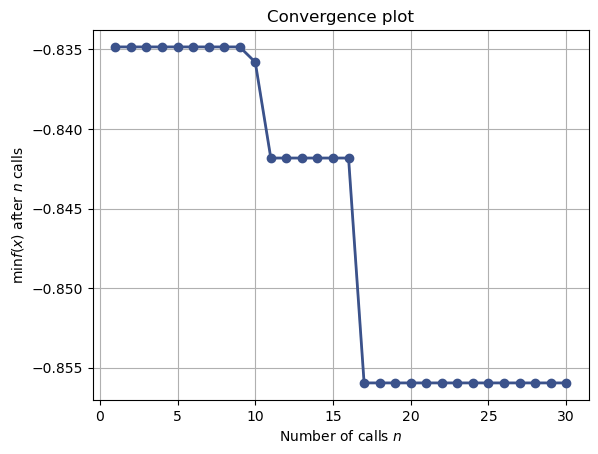

In [106]:
from skopt.plots import plot_objective, plot_histogram
from skopt.plots import plot_convergence
#plot_convergence(BayesSearchCV)
plot_convergence(opt.optimizer_results_)

In [107]:
# Let's check stability and do some visulization on prections
plt.figure(figsize=(20,5))

iterations=30
mlp_scores_mse  = []
mlp_scores_rmse = []
mlp_scores_mae  = []
mlp_scores_r2   = []

for i in range(iterations):
    X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.2, random_state=100+i)
    # ใช้ Yeo-Johnson Transformation (standardize=True)
    pt_X = PowerTransformer(method='yeo-johnson', standardize=True)
    pt_y = PowerTransformer(method='yeo-johnson', standardize=True)

    # Fit และแปลงข้อมูล Train
    X_train = pt_X.fit_transform(X_train)
    y_train = pt_y.fit_transform(y_train.reshape(-1, 1))

    # แปลงข้อมูล Test
    X_test = pt_X.transform(X_test)
    
    # prdict
    y_pred = opt.predict(X_test)
    # แปลงคืนค่าพยากรณ์
    y_pred_original = pt_y.inverse_transform(y_pred.reshape(-1, 1))


    mse_test  = mean_squared_error(y_test, y_pred_original)
    rmse_test = np.sqrt(mse_test)
    mae_test  = mean_absolute_error(y_test, y_pred_original)
    r2_test   = r2_score(y_test, y_pred_original)
     
    mlp_scores_mse.append(mse_test)
    mlp_scores_rmse.append(rmse_test)
    mlp_scores_mae.append(mae_test)
    mlp_scores_r2.append(r2_test)

<Figure size 2000x500 with 0 Axes>

In [108]:
print("---")
print("mlp_scores_mse_mean = ", np.mean(mlp_scores_mse))
print("mlp_scores_mse_std  = ",np.std(mlp_scores_mse))
print("---")

print("---")
print("mlp_scores_rmse_mean = ", np.mean(mlp_scores_rmse))
print("mlp_scores_rmse_std  = ",np.std(mlp_scores_rmse))
print("---")

print("---")
print("mlp_scores_mae_mean = ", np.mean(mlp_scores_mae))
print("mlp_scores_mae_std  = ",np.std(mlp_scores_mae))
print("---")

print("---")
print("mlp_scores_r2_mean = ", np.mean(mlp_scores_r2))
print("mlp_scores_r2_std  = ",np.std(mlp_scores_r2))
print("---")


---
mlp_scores_mse_mean =  0.02037547134973806
mlp_scores_mse_std  =  0.0055671157264931565
---
---
mlp_scores_rmse_mean =  0.14144433792477126
mlp_scores_rmse_std  =  0.019208607933975216
---
---
mlp_scores_mae_mean =  0.06853867450775919
mlp_scores_mae_std  =  0.006718790676988827
---
---
mlp_scores_r2_mean =  0.9750926287869645
mlp_scores_r2_std  =  0.0072112033884656436
---


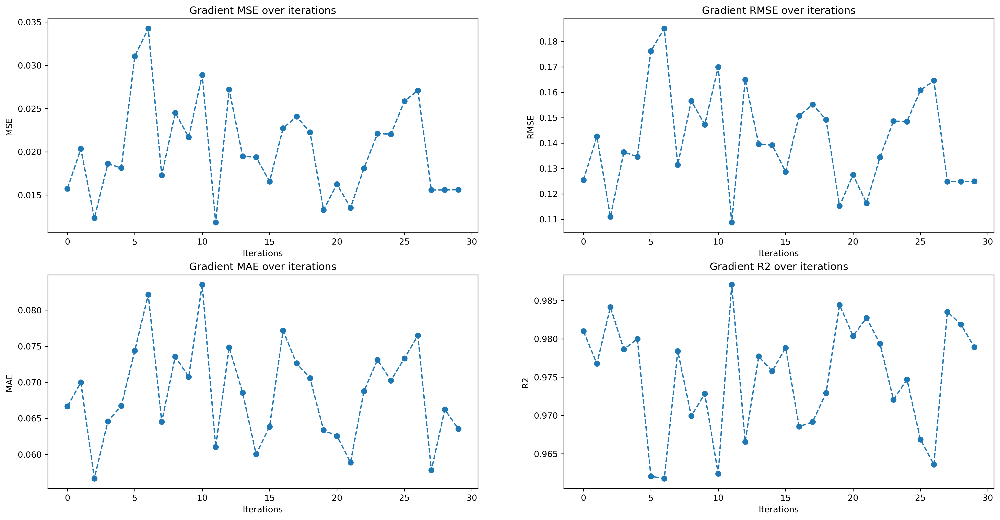

In [109]:
plt.figure(figsize=(20,10),dpi = 300)

### MSE
plt.subplot(2,2,1)
plt.plot(range(iterations), mlp_scores_mse, marker = "o", linestyle = "dashed")
plt.title('Gradient MSE over iterations')
plt.xlabel("Iterations")
plt.ylabel("MSE ")
plt.grid(False)
### RMSE
plt.subplot(2,2,2)
plt.plot(range(iterations), mlp_scores_rmse, marker = "o", linestyle = "dashed")
plt.title('Gradient RMSE over iterations')
plt.xlabel("Iterations")
plt.ylabel("RMSE ")
plt.grid(False)
### MAE
plt.subplot(2,2,3)
plt.plot(range(iterations), mlp_scores_mae, marker = "o", linestyle = "dashed")
plt.title('Gradient MAE over iterations')
plt.xlabel("Iterations")
plt.ylabel("MAE ")
plt.grid(False)
### R2
plt.subplot(2,2,4)
plt.plot(range(iterations), mlp_scores_r2, marker = "o", linestyle = "dashed")
plt.title('Gradient R2 over iterations')
plt.xlabel("Iterations")
plt.ylabel("R2 ")

#plt.legend()
plt.grid(False)
plt.show()

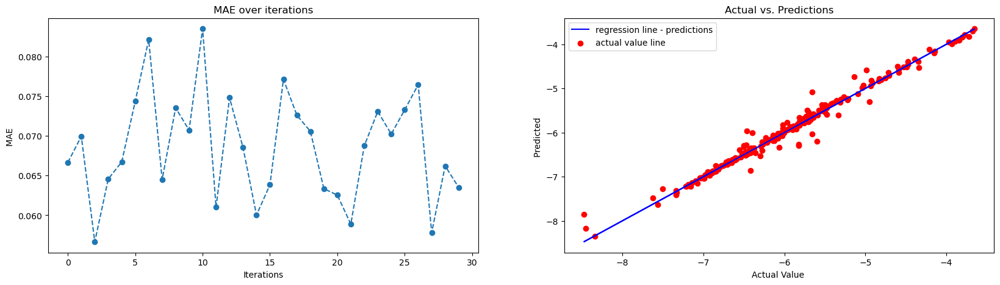

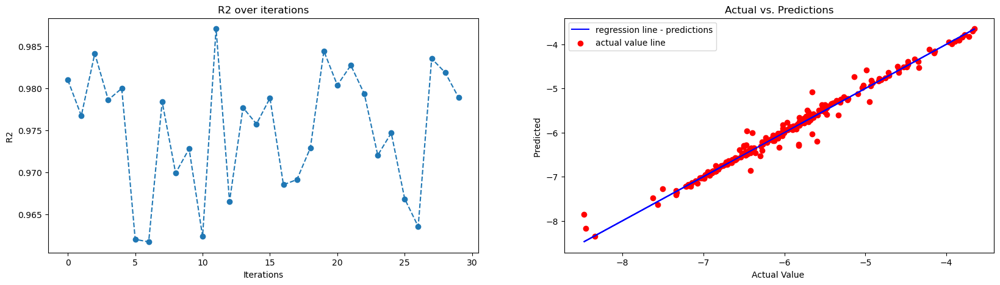

In [110]:
# Plot performance over iterations
plt.figure(figsize=(20,5))

# Plot predicted vs. actual sale prices

X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.2, random_state=100)
# ใช้ Yeo-Johnson Transformation (standardize=True)
pt_X = PowerTransformer(method='yeo-johnson', standardize=True)
pt_y = PowerTransformer(method='yeo-johnson', standardize=True)

# Fit และแปลงข้อมูล Train
X_train = pt_X.fit_transform(X_train)
y_train = pt_y.fit_transform(y_train.reshape(-1, 1))

# แปลงข้อมูล Test
X_test = pt_X.transform(X_test)
    
# prdict
y_pred = opt.predict(X_test)
# แปลงคืนค่าพยากรณ์
y_pred_original = pt_y.inverse_transform(y_pred.reshape(-1, 1))


### MSE
plt.subplot(1,2,1)
plt.plot(range(iterations), mlp_scores_mae, marker = "o", linestyle = "dashed")
plt.title('MAE over iterations')
plt.xlabel("Iterations")
plt.ylabel("MAE ")

# Plot predicted vs. actual sale prices
plt.subplot(1,2,2)
plt.plot(y_test, y_test, color='b', label='regression line - predictions')
# plt.xlim(13, 14)  
plt.scatter(y_test, y_pred_original, color='r', label='actual value line')
plt.xlabel("Actual Value ")
plt.ylabel("Predicted ")
plt.title('Actual vs. Predictions')
plt.legend()
plt.grid(False)
plt.show()
###

###

###R2
plt.figure(figsize=(20,5))


X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.2, random_state=100)
# ใช้ Yeo-Johnson Transformation (standardize=True)
pt_X = PowerTransformer(method='yeo-johnson', standardize=True)
pt_y = PowerTransformer(method='yeo-johnson', standardize=True)

# Fit และแปลงข้อมูล Train
X_train = pt_X.fit_transform(X_train)
y_train = pt_y.fit_transform(y_train.reshape(-1, 1))

# แปลงข้อมูล Test
X_test = pt_X.transform(X_test)
    
# prdict
y_pred = opt.predict(X_test)
# แปลงคืนค่าพยากรณ์
y_pred_original = pt_y.inverse_transform(y_pred.reshape(-1, 1))


plt.subplot(1,2,1)
plt.plot(range(iterations), mlp_scores_r2, marker = "o", linestyle = "dashed")
plt.title('R2 over iterations')
plt.xlabel("Iterations")
plt.ylabel("R2 ")

# Plot predicted vs. actual sale prices
plt.subplot(1,2,2)
plt.plot(y_test, y_test, color='b', label='regression line - predictions')
# plt.xlim(13, 14)  
plt.scatter(y_test, y_pred_original, color='r', label='actual value line')
plt.xlabel("Actual Value ")
plt.ylabel("Predicted ")
plt.title('Actual vs. Predictions')
plt.legend()
plt.grid(False)
plt.show()
###

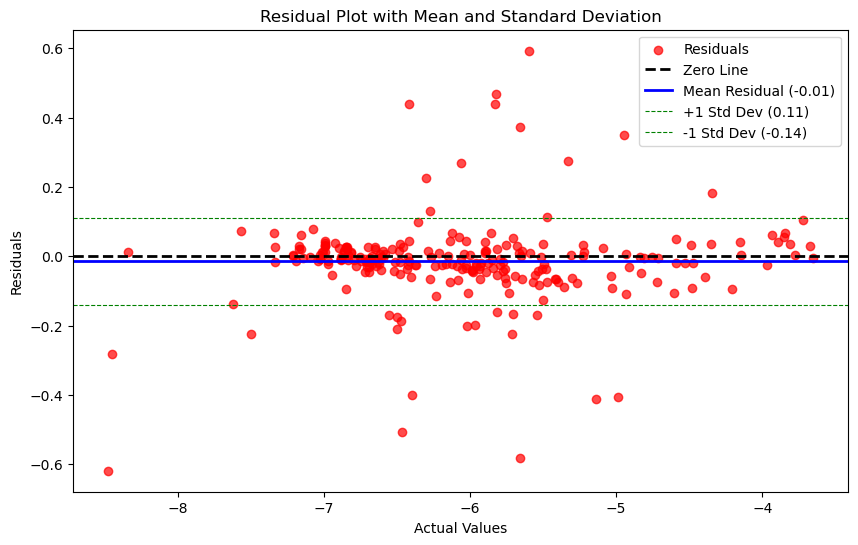

In [111]:
# Residual Plot (Scaled Values)
residuals_scaled = y_test - y_pred_original
plt.figure(figsize=(10, 6))
plt.scatter(y_test, residuals_scaled, alpha=0.7, color='red', label='Residuals')
plt.axhline(0, color='black', linewidth=2, linestyle='--', label='Zero Line')

# Add Mean and Std Dev Lines (Scaled Values)
mean_residual = np.mean(residuals_scaled)
std_residual = np.std(residuals_scaled)
plt.axhline(mean_residual, color='blue', linewidth=2, linestyle='-', label=f'Mean Residual ({mean_residual:.2f})')
plt.axhline(mean_residual + std_residual, color='green', linestyle='--', linewidth=0.8, label=f'+1 Std Dev ({mean_residual + std_residual:.2f})')
plt.axhline(mean_residual - std_residual, color='green', linestyle='--', linewidth=0.8, label=f'-1 Std Dev ({mean_residual - std_residual:.2f})')

plt.xlabel("Actual Values")
plt.ylabel("Residuals")
plt.title("Residual Plot with Mean and Standard Deviation")
plt.legend()
plt.grid(False)
plt.show()



## Stacking Ensemble

In [112]:
model_list = ["KRR","SVR","LGBR","MLP"]
model_list

['KRR', 'SVR', 'LGBR', 'MLP']

In [113]:
r2_krr   = np.mean(krr_scores_r2)
r2_svr   = np.mean(svr_scores_r2)
r2_lgbmr = np.mean(lgbmr_scores_r2)
r2_mlp   = np.mean(mlp_scores_r2)

r2_list = [r2_krr, r2_svr, r2_lgbmr, r2_mlp]
r2_list

[0.9698495621757756,
 0.9738257306033691,
 0.9674431951182014,
 0.9750926287869645]

In [114]:
inv_r2 = np.array([1/m for m in r2_list])
weights = inv_r2 / inv_r2.sum()

print("Original Weights:", weights)

# กำหนดขอบเขตน้ำหนักต่ำสุด-สูงสุด
min_weight = 0.2
max_weight = 0.8

# Clip น้ำหนักให้อยู่ในช่วง [min_weight, max_weight]
weights = np.clip(weights, min_weight, max_weight)

# หลัง Clip อาจทำให้ผลรวมไม่เท่ากับ 1 ต้อง normalize ใหม่
weights = weights / weights.sum()

print("Clipped and Normalized Weights:", weights)


Original Weights: [0.25043655 0.24941401 0.25105948 0.24908996]
Clipped and Normalized Weights: [0.25043655 0.24941401 0.25105948 0.24908996]


In [115]:
weights

array([0.25043655, 0.24941401, 0.25105948, 0.24908996])

In [116]:
# Let's check stability and do some visulization on prections
plt.figure(figsize=(20,5))

iterations=30
stack_scores_mse  = []
stack_scores_rmse = []
stack_scores_mae  = []
stack_scores_r2   = []

for i in range(iterations):
    X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.2, random_state=100+i)
    # ใช้ Yeo-Johnson Transformation (standardize=True)
    pt_X = PowerTransformer(method='yeo-johnson', standardize=True)
    pt_y = PowerTransformer(method='yeo-johnson', standardize=True)

    # Fit และแปลงข้อมูล Train
    X_train = pt_X.fit_transform(X_train)
    y_train = pt_y.fit_transform(y_train.reshape(-1, 1))

    # แปลงข้อมูล Test
    X_test = pt_X.transform(X_test)
    
    ##### prdicted krr 
    y_pred_krr = KRR_bayes_search.predict(X_test)
    # แปลงคืนค่าพยากรณ์
    y_pred_original_krr = weights[0]*pt_y.inverse_transform(y_pred_krr.reshape(-1, 1))
    #####
    
    ##### prdicted svr 
    y_pred_svr = SVR_bayes_cv.predict(X_test)
    # แปลงคืนค่าพยากรณ์
    y_pred_original_svr = weights[1]*pt_y.inverse_transform(y_pred_svr.reshape(-1, 1))
    #####
  
    ##### prdicted lgbmr 
    y_pred_lgbmr = LGBMR_bayes_search.predict(X_test)
    # แปลงคืนค่าพยากรณ์
    y_pred_original_lgbmr = weights[2]*pt_y.inverse_transform(y_pred_lgbmr.reshape(-1, 1))
    #####
  
    ##### prdicted mlp 
    y_pred_mlp = opt.predict(X_test)
    # แปลงคืนค่าพยากรณ์
    y_pred_original_mlp = weights[3]*pt_y.inverse_transform(y_pred_mlp.reshape(-1, 1))
    #####
      
    y_pred_original = y_pred_original_krr + y_pred_original_svr + y_pred_original_lgbmr + y_pred_original_mlp
    

    mse_test  = mean_squared_error(y_test, y_pred_original)
    rmse_test = np.sqrt(mse_test)
    mae_test  = mean_absolute_error(y_test, y_pred_original)
    r2_test   = r2_score(y_test, y_pred_original)
     
    stack_scores_mse.append(mse_test)
    stack_scores_rmse.append(rmse_test)
    stack_scores_mae.append(mae_test)
    stack_scores_r2.append(r2_test)

<Figure size 2000x500 with 0 Axes>

In [117]:
print("---")
print("stack_scores_mse_mean = ", np.mean(stack_scores_mse))
print("stack_scores_mse_std  = ",np.std(stack_scores_mse))
print("---")

print("---")
print("stack_scores_rmse_mean = ", np.mean(stack_scores_rmse))
print("stack_scores_rmse_std  = ",np.std(stack_scores_rmse))
print("---")

print("---")
print("stack_scores_mae_mean = ", np.mean(stack_scores_mae))
print("stack_scores_mae_std  = ",np.std(stack_scores_mae))
print("---")

print("---")
print("stack_scores_r2_mean = ", np.mean(stack_scores_r2))
print("stack_scores_r2_std  = ",np.std(stack_scores_r2))
print("---")


---
stack_scores_mse_mean =  0.017202637696317264
stack_scores_mse_std  =  0.00382033984697023
---
---
stack_scores_rmse_mean =  0.1303512358887523
stack_scores_rmse_std  =  0.014532480813409627
---
---
stack_scores_mae_mean =  0.06942611243959325
stack_scores_mae_std  =  0.006095566215083492
---
---
stack_scores_r2_mean =  0.9790159467604481
stack_scores_r2_std  =  0.004917841034856544
---


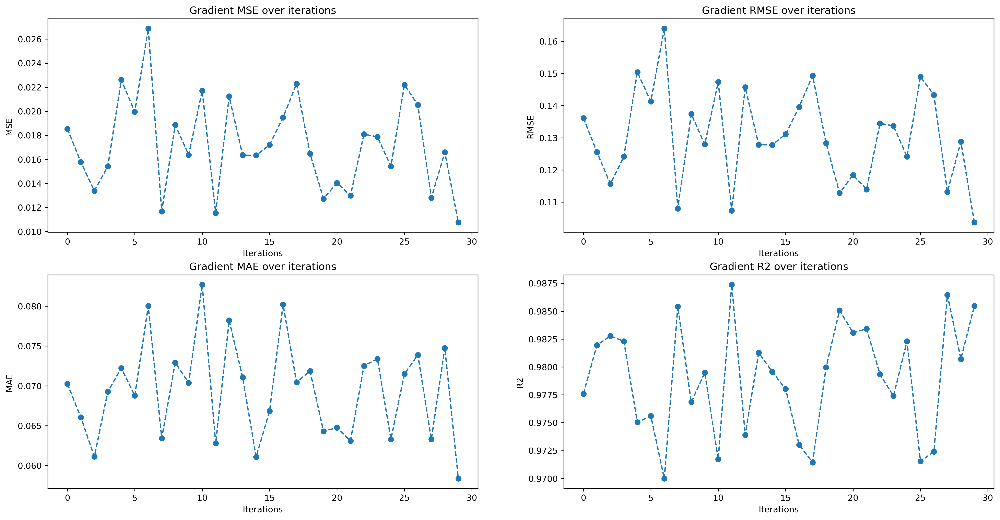

In [118]:
plt.figure(figsize=(20,10),dpi = 300)

### MSE
plt.subplot(2,2,1)
plt.plot(range(iterations), stack_scores_mse, marker = "o", linestyle = "dashed")
plt.title('Gradient MSE over iterations')
plt.xlabel("Iterations")
plt.ylabel("MSE ")
plt.grid(False)
### RMSE
plt.subplot(2,2,2)
plt.plot(range(iterations), stack_scores_rmse, marker = "o", linestyle = "dashed")
plt.title('Gradient RMSE over iterations')
plt.xlabel("Iterations")
plt.ylabel("RMSE ")
plt.grid(False)
### MAE
plt.subplot(2,2,3)
plt.plot(range(iterations), stack_scores_mae, marker = "o", linestyle = "dashed")
plt.title('Gradient MAE over iterations')
plt.xlabel("Iterations")
plt.ylabel("MAE ")
plt.grid(False)
### R2
plt.subplot(2,2,4)
plt.plot(range(iterations), stack_scores_r2, marker = "o", linestyle = "dashed")
plt.title('Gradient R2 over iterations')
plt.xlabel("Iterations")
plt.ylabel("R2 ")

#plt.legend()
plt.grid(False)
plt.show()

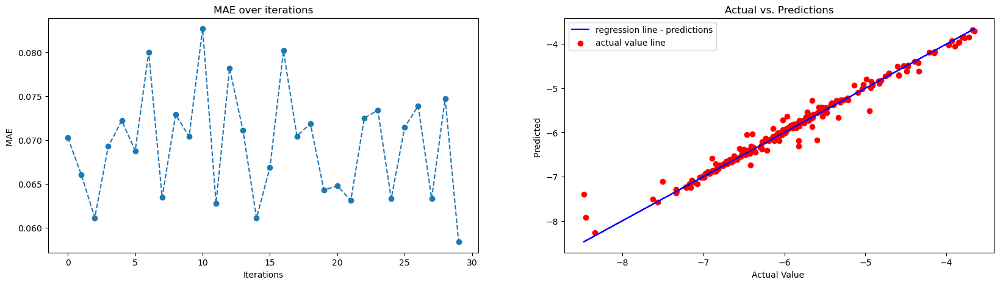

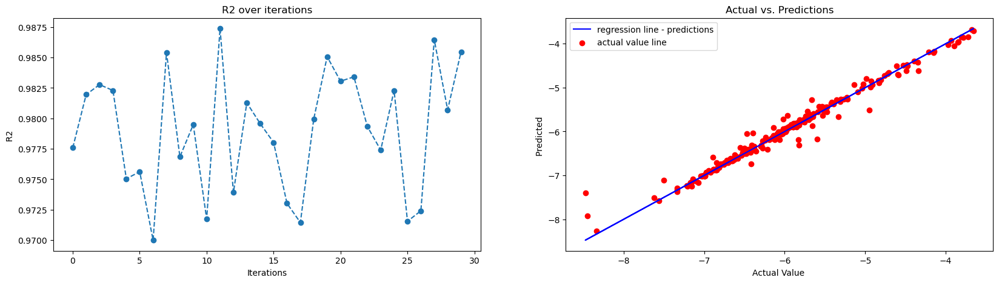

In [119]:
# Plot performance over iterations
plt.figure(figsize=(20,5))

# Plot predicted vs. actual sale prices

X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.2, random_state=100)
# ใช้ Yeo-Johnson Transformation (standardize=True)
pt_X = PowerTransformer(method='yeo-johnson', standardize=True)
pt_y = PowerTransformer(method='yeo-johnson', standardize=True)

# Fit และแปลงข้อมูล Train
X_train = pt_X.fit_transform(X_train)
y_train = pt_y.fit_transform(y_train.reshape(-1, 1))

# แปลงข้อมูล Test
X_test = pt_X.transform(X_test)
    
##### prdicted krr 
y_pred_krr = KRR_bayes_search.predict(X_test)
# แปลงคืนค่าพยากรณ์
y_pred_original_krr = weights[0]*pt_y.inverse_transform(y_pred_krr.reshape(-1, 1))
#####
    
##### prdicted svr 
y_pred_svr = SVR_bayes_cv.predict(X_test)
# แปลงคืนค่าพยากรณ์
y_pred_original_svr = weights[1]*pt_y.inverse_transform(y_pred_svr.reshape(-1, 1))
#####
  
##### prdicted lgbmr 
y_pred_lgbmr = LGBMR_bayes_search.predict(X_test)
# แปลงคืนค่าพยากรณ์
y_pred_original_lgbmr = weights[2]*pt_y.inverse_transform(y_pred_lgbmr.reshape(-1, 1))
#####
  
##### prdicted mlp 
y_pred_mlp = opt.predict(X_test)
# แปลงคืนค่าพยากรณ์
y_pred_original_mlp = weights[3]*pt_y.inverse_transform(y_pred_mlp.reshape(-1, 1))
#####
      
y_pred_original = y_pred_original_krr + y_pred_original_svr + y_pred_original_lgbmr + y_pred_original_mlp
    


### MAE
plt.subplot(1,2,1)
plt.plot(range(iterations), stack_scores_mae, marker = "o", linestyle = "dashed")
plt.title('MAE over iterations')
plt.xlabel("Iterations")
plt.ylabel("MAE ")

# Plot predicted vs. actual sale prices
plt.subplot(1,2,2)
plt.plot(y_test, y_test, color='b', label='regression line - predictions')
# plt.xlim(13, 14)  
plt.scatter(y_test, y_pred_original, color='r', label='actual value line')
plt.xlabel("Actual Value ")
plt.ylabel("Predicted ")
plt.title('Actual vs. Predictions')
plt.legend()
plt.grid(False)
plt.show()
###

###

###R2
plt.figure(figsize=(20,5))

#X = data_copy.drop(["energy_per_atom"], axis=1).values
#y = data_copy['energy_per_atom'].values.reshape(-1,1)

# Plot predicted vs. actual sale prices

X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.2, random_state=100)
# ใช้ Yeo-Johnson Transformation (standardize=True)
pt_X = PowerTransformer(method='yeo-johnson', standardize=True)
pt_y = PowerTransformer(method='yeo-johnson', standardize=True)

# Fit และแปลงข้อมูล Train
X_train = pt_X.fit_transform(X_train)
y_train = pt_y.fit_transform(y_train.reshape(-1, 1))

# แปลงข้อมูล Test
X_test = pt_X.transform(X_test)
    
##### prdicted krr 
y_pred_krr = KRR_bayes_search.predict(X_test)
# แปลงคืนค่าพยากรณ์
y_pred_original_krr = weights[0]*pt_y.inverse_transform(y_pred_krr.reshape(-1, 1))
#####
    
##### prdicted svr 
y_pred_svr = SVR_bayes_cv.predict(X_test)
# แปลงคืนค่าพยากรณ์
y_pred_original_svr = weights[1]*pt_y.inverse_transform(y_pred_svr.reshape(-1, 1))
#####
  
##### prdicted lgbmr 
y_pred_lgbmr = LGBMR_bayes_search.predict(X_test)
# แปลงคืนค่าพยากรณ์
y_pred_original_lgbmr = weights[2]*pt_y.inverse_transform(y_pred_lgbmr.reshape(-1, 1))
#####
  
##### prdicted mlp 
y_pred_mlp = opt.predict(X_test)
# แปลงคืนค่าพยากรณ์
y_pred_original_mlp = weights[3]*pt_y.inverse_transform(y_pred_mlp.reshape(-1, 1))
#####
      
y_pred_original = y_pred_original_krr + y_pred_original_svr + y_pred_original_lgbmr + y_pred_original_mlp
    


plt.subplot(1,2,1)
plt.plot(range(iterations), stack_scores_r2, marker = "o", linestyle = "dashed")
plt.title('R2 over iterations')
plt.xlabel("Iterations")
plt.ylabel("R2 ")

# Plot predicted vs. actual sale prices
plt.subplot(1,2,2)
plt.plot(y_test, y_test, color='b', label='regression line - predictions')
# plt.xlim(13, 14)  
plt.scatter(y_test, y_pred_original, color='r', label='actual value line')
plt.xlabel("Actual Value ")
plt.ylabel("Predicted ")
plt.title('Actual vs. Predictions')
plt.legend()
plt.grid(False)
plt.show()
###

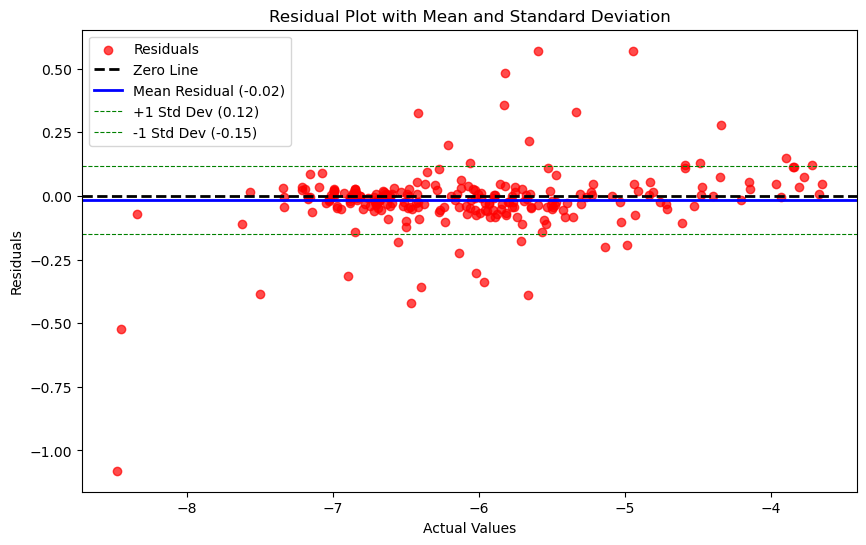

In [120]:
# Residual Plot (Scaled Values)
residuals_scaled = y_test - y_pred_original
plt.figure(figsize=(10, 6))
plt.scatter(y_test, residuals_scaled, alpha=0.7, color='red', label='Residuals')
plt.axhline(0, color='black', linewidth=2, linestyle='--', label='Zero Line')

# Add Mean and Std Dev Lines (Scaled Values)
mean_residual = np.mean(residuals_scaled)
std_residual = np.std(residuals_scaled)
plt.axhline(mean_residual, color='blue', linewidth=2, linestyle='-', label=f'Mean Residual ({mean_residual:.2f})')
plt.axhline(mean_residual + std_residual, color='green', linestyle='--', linewidth=0.8, label=f'+1 Std Dev ({mean_residual + std_residual:.2f})')
plt.axhline(mean_residual - std_residual, color='green', linestyle='--', linewidth=0.8, label=f'-1 Std Dev ({mean_residual - std_residual:.2f})')

plt.xlabel("Actual Values")
plt.ylabel("Residuals")
plt.title("Residual Plot with Mean and Standard Deviation")
plt.legend()
plt.grid(False)
plt.show()
